# Business Case: Hotel Booking Cancelation Predictive Model

## Navegation

[<b><font color='#151B54' size=3>1 - Data Understanding</font><b>](#one-bullet) <br>
    [<font color='#151B54' size=2>1.1. - Loading the Dataset</font>](#two-bullet) <br>
    [<font color='#151B54' size=2>1.2. - Describing the Data</font>](#three-bullet) <br>
    [<font color='#151B54' size=2>1.3. - Exploring Data</font>](#four-bullet) <br>
    
[<b><font color='#151B54' size=3>2 - Data Preparation</font><b>](#five-bullet) <br>
    [<font color='#151B54' size=2>2.1. - Data Cleaning</font>](#six-bullet) <br>
    [<font color='#151B54' size=2>2.2. - Feature Engineering</font>](#seven-bullet) <br>
    [<font color='#151B54' size=2>2.3. - Data Exploration Revisit</font>](#eight-bullet) <br>
    [<font color='#151B54' size=2>2.4. - Feature Selection</font>](#nine-bullet) <br>
    
[<b><font color='#151B54' size=3>3 - Modeling </font><b>](#ten-bullet) <br>
    [<font color='#151B54' size=2>3.1. - Model Selection</font>](#eleven-bullet) <br>
    [<font color='#151B54' size=2>3.2. - Building Model and Checking Performance</font>](#twelve-bullet) <br>

## Libraries Import

In [1]:
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import scipy.stats as stats

from math import ceil
from PIL import Image
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, PowerTransformer, RobustScaler
from sklearn.model_selection import train_test_split
from scipy.stats import chi2_contingency
from sklearn.feature_selection import RFE
from sklearn.linear_model import LassoCV

from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedKFold

from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

<div class="alert alert-block alert-info">
<a class="anchor" id="one-bullet">     

# 1. Data Understanding
</a>    
</div>

### `Loading the Dataset` <a id="two-bullet"></a>

In [2]:
# Loading the dataset-csv file into a pandas dataframe and checking it
df_original = pd.read_csv('H2.csv')
df_original

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
0,0,6,2015,July,27,1,0,2,1,0.0,...,No Deposit,6,NULL,0,Transient,0.00,0,0,Check-Out,2015-07-03
1,1,88,2015,July,27,1,0,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.50,0,1,Canceled,2015-07-01
2,1,65,2015,July,27,1,0,4,1,0.0,...,No Deposit,9,NULL,0,Transient,68.00,0,1,Canceled,2015-04-30
3,1,92,2015,July,27,1,2,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.50,0,2,Canceled,2015-06-23
4,1,100,2015,July,27,2,0,2,2,0.0,...,No Deposit,9,NULL,0,Transient,76.50,0,1,Canceled,2015-04-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79325,0,23,2017,August,35,30,2,5,2,0.0,...,No Deposit,394,NULL,0,Transient,96.14,0,0,Check-Out,2017-09-06
79326,0,102,2017,August,35,31,2,5,3,0.0,...,No Deposit,9,NULL,0,Transient,225.43,0,2,Check-Out,2017-09-07
79327,0,34,2017,August,35,31,2,5,2,0.0,...,No Deposit,9,NULL,0,Transient,157.71,0,4,Check-Out,2017-09-07
79328,0,109,2017,August,35,31,2,5,2,0.0,...,No Deposit,89,NULL,0,Transient,104.40,0,0,Check-Out,2017-09-07


### `Describing the Data` <a id="three-bullet"></a>

In [3]:
# Removing extra spaces in string columns values
df_original = df_original.applymap(lambda x: x.strip() if isinstance(x, str) else x)

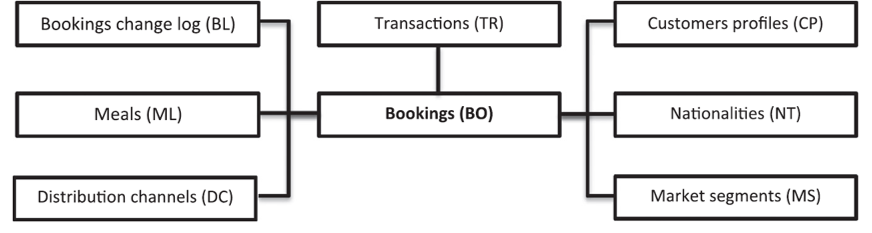

In [4]:
# Framework representing the source of the data
source_of_data_image = Image.open('Data_Source.png')
source_of_data_image

In [5]:
# Checking how many NULL entries are there for Company
df_original['Company'].value_counts()

NULL    75641
40        924
67        267
45        250
153       215
        ...  
356         1
160         1
361         1
362         1
137         1
Name: Company, Length: 208, dtype: int64

<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - The dataset contains 31 columns - 31 Features/Variables <br>
    - The variable Company presents 75,641 NULL values - it represents 95,35% - We will probably need to drop this variable <br>
    - The dataset has 79,330 observations <br>
    
</div>

__Metadata:__
- *ADR* - Average Daily Rate
- *Adults* - Number of adults
- *Agent* - ID of the travel agency that made the booking
- *ArrivalDateDayOfMonth* - Day of the month of the arrival date
- *ArrivalDateMonth* - Month of arrival date with 12 categories:  “January” to “December”
- *ArrivalDateWeekNumber* - Week number of the arrival date
- *ArrivalDateYear* - Year of the arrival date
- *AssignedRoomType* - Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request. Code is presented instead of designation for anonymity reasons
- *Babies* - Number of babies
- *BookingChanges* - Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation
- *Children* - Number of children
- *Company* - ID of the company/entity that made the booking or responsible for paying the booking. ID is presented instead of designation for anonymity reasons
- *Country* - Country of origin. Categories are represented in the ISO 3155-3:2013 format
- *CustomerType* - Type of booking, assuming one of four possible categories (presented below)
- *DaysInWaitingList* - Number of days the booking was in the waiting list before it was confirmed to the customer
- *DepositType* - Indication on if the customer made a deposit to guarantee the booking. This variable can assume three categories (presented)
- *DistributionChannel* - Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators”
- *IsCanceled* - Value indicating if the booking was canceled (1) or not (0)
- *IsRepeatedGuest* - Value indicating if the booking name was from a repeated guest (1) or not (0)
- *LeadTime* - Number of days that elapsed between the entering date of the booking into the PMS and the arrival date
- *MarketSegment* - Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators"
- *Meal* - Type of meal booked. Categories are presented in standard hospitality meal packages (presented below)
- *PreviousBookingsNotCanceled* - Number of previous bookings not cancelled by the customer prior to the current booking
- *PreviousCancellations* - Number of previous bookings that were cancelled by the customer prior to the current booking
- *RequiredCarParkingSpaces* - Number of car parking spaces required by the customer
- *ReservationStatus* - Reservation last status, assuming one of three categories (presented below)
- *ReservationStatusDate* - Date at which the last status was set. This variable can be used in conjunction with the ReservationStatus to
- *ReservedRoomType* - Code of room type reserved. Code is presented instead of designation for anonymity reasons
- *StaysInWeekendNights* - Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
- *StaysInWeekNights* - Number of weeknights (Monday to Friday) the guest stayed or booked to stay at the hotel
- *TotalOfSpecialRequests* - Number of special requests made by the customer (e.g. twin bed or high floor)

In [6]:
# Checking general information about the dataset and its variables 
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79330 entries, 0 to 79329
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   IsCanceled                   79330 non-null  int64  
 1   LeadTime                     79330 non-null  int64  
 2   ArrivalDateYear              79330 non-null  int64  
 3   ArrivalDateMonth             79330 non-null  object 
 4   ArrivalDateWeekNumber        79330 non-null  int64  
 5   ArrivalDateDayOfMonth        79330 non-null  int64  
 6   StaysInWeekendNights         79330 non-null  int64  
 7   StaysInWeekNights            79330 non-null  int64  
 8   Adults                       79330 non-null  int64  
 9   Children                     79326 non-null  float64
 10  Babies                       79330 non-null  int64  
 11  Meal                         79330 non-null  object 
 12  Country                      79306 non-null  object 
 13  MarketSegment   

<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - The dataset contains categorical and numeric variables <br>
    - Within the categorical variables, there are only nominal variables <br>
    - Within the numeric variables, there is only one continuous...<br>
    - ReservationStatusDate is stored as object(string) instead of a data format <br>
    - IsCanceled is the target for the predictive model
    
</div>

In [7]:
# Grouping the variables as per their types and assigning them to lists

cat_nominal = ['ArrivalDateMonth',
               'Meal',
               'Country',
               'MarketSegment',
               'DistributionChannel',
               'ReservedRoomType',
               'AssignedRoomType',
               'DepositType',
               'Agent',
               'Company',
               'CustomerType',
               'ReservationStatus'
              ]

num_discrete = ['LeadTime',
                'ArrivalDateYear',                
                'ArrivalDateWeekNumber',
                'ArrivalDateDayOfMonth',
                'StaysInWeekendNights',
                'StaysInWeekNights',
                'Adults',
                'Children',
                'Babies',                
                'PreviousCancellations',
                'PreviousBookingsNotCanceled',
                'BookingChanges',
                'DaysInWaitingList',
                'RequiredCarParkingSpaces',
                'TotalOfSpecialRequests'           
               ]

num_continuous = ['ADR']

num_discrete_binary = ['IsRepeatedGuest']

date = ['ReservationStatusDate']

target = ['IsCanceled']

all_variables = cat_nominal+num_discrete+num_continuous+num_discrete_binary+date+target

print('Total number of variables assigned to lists: ',len(all_variables))

Total number of variables assigned to lists:  31


In [8]:
# replace "" by nans and checking the total quantity of Nans per feature
df_original.replace("", np.nan, inplace=True)
df_original.isna().sum()

IsCanceled                      0
LeadTime                        0
ArrivalDateYear                 0
ArrivalDateMonth                0
ArrivalDateWeekNumber           0
ArrivalDateDayOfMonth           0
StaysInWeekendNights            0
StaysInWeekNights               0
Adults                          0
Children                        4
Babies                          0
Meal                            0
Country                        24
MarketSegment                   0
DistributionChannel             0
IsRepeatedGuest                 0
PreviousCancellations           0
PreviousBookingsNotCanceled     0
ReservedRoomType                0
AssignedRoomType                0
BookingChanges                  0
DepositType                     0
Agent                           0
Company                         0
DaysInWaitingList               0
CustomerType                    0
ADR                             0
RequiredCarParkingSpaces        0
TotalOfSpecialRequests          0
ReservationSta

<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - Children has 4 rows with missing values <br>
    - Country has 24 rows with missing values
    
</div>

In [9]:
# checking duplicated observations
df_original.duplicated().sum()

25902

In [10]:
# Taking a look at the duplicated rows
df_original[df_original.duplicated(keep=False)]

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
8,1,62,2015,July,27,2,2,3,2,0.0,...,No Deposit,8,NULL,0,Transient,76.50,0,1,No-Show,2015-07-02
9,1,62,2015,July,27,2,2,3,2,0.0,...,No Deposit,8,NULL,0,Transient,76.50,0,1,No-Show,2015-07-02
10,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
12,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
17,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79292,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79293,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79294,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79312,0,175,2017,August,35,31,1,3,1,0.0,...,No Deposit,42,NULL,0,Transient,82.35,0,1,Check-Out,2017-09-04


In [11]:
# Checking the distribution of CustomerType for the duplicates
df_original[df_original.duplicated(keep=False)]['CustomerType'].value_counts(normalize=True)

Transient          0.573201
Transient-Party    0.394545
Contract           0.031026
Group              0.001228
Name: CustomerType, dtype: float64

<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - The dataset contains 25,902 duplicated rows. This duplicates represent 31,748 bookings, or 40% of the observations <br>
    - Within the duplicates, 57.32% are Transient customers, and 39.45% are Transient-Party customers: <br>
__Contract__: when the booking has an allotment or other type of contract associated to it; <br>
__Group__: when the booking is associated to a group; <br>
__Transient__: when the booking is not part of a group or contract, and is not associated to other transient booking; <br>
__Transient-party__: when the booking is transient, but is associated to at least other transient booking. <br>
    - Considering the large number of duplicates, and considering that the probability of multiple bookings being identical is low, the best decision here is to drop the duplicates.
    
</div>

In [12]:
# descriptive statistics for metric features
variables_to_use = num_discrete + num_continuous + num_discrete_binary + target

df_original[variables_to_use].describe(include="all").T

,count,mean,std,min,25%,50%,75%,max
LeadTime,79330.0,109.735724,110.948526,0.0,23.0,74.0,163.0,629.0
ArrivalDateYear,79330.0,2016.174285,0.699181,2015.0,2016.0,2016.0,2017.0,2017.0
ArrivalDateWeekNumber,79330.0,27.177449,13.398523,1.0,17.0,27.0,38.0,53.0
ArrivalDateDayOfMonth,79330.0,15.786625,8.728451,1.0,8.0,16.0,23.0,31.0
StaysInWeekendNights,79330.0,0.795185,0.885026,0.0,0.0,1.0,2.0,16.0
StaysInWeekNights,79330.0,2.182957,1.456416,0.0,1.0,2.0,3.0,41.0
Adults,79330.0,1.850977,0.509292,0.0,2.0,2.0,2.0,4.0
Children,79326.0,0.091370,0.372177,0.0,0.0,0.0,0.0,3.0
Babies,79330.0,0.004941,0.084323,0.0,0.0,0.0,0.0,10.0
PreviousCancellations,79330.0,0.079743,0.415472,0.0,0.0,0.0,0.0,21.0


<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - On average, guests book their rooms with 109.73 days in advance <br>
    - Only 2.56% are repeated guests <br>
    - 41.73% of the bookings from this dataset got canceled (cancelation or no show). This shows a slightly imbalanced dataset, some balance method might me necessary depending on the modeling method that will be used <br>
    - Arrival date year is divided into only three years 2015, 2016 and 2017 <br>
    - Adults has a mean of 1.85, with a minimum of 0 (it has to be checked if it is possible to have reservations without adults) and a maximum of 4 <br>
    - Babies has a mean of 0.005, showing that most of reversations are for people without babies. The maximum is 10, which is a entry that has to be checked because it might be an error <br>
    - PreviousCancellations has a men of 0.08, which shows that the majority of reservations/guests haven't canceled before. In this case, for a predictive model, checking the history of cancelation might not be a good approach. <br>
    - PreviousBookingsNotCanceled has a mean of 0.13. It has to be checked in more details, but this information together with PreviousCancellations mean and IsRepeatedGuest suggests the majority of this bookings in this dataset are first time guests. Confirming once again that guest's history won't add any information to the predictive model. <br>
    - RequiredCarParkingSpaces has a low mean of 0.02, showing that the majority of guests stays in the hotel without cars, which might be due to a large number of international customers traveling by flight. <br>
    - The Average daily rate (ADR) 105.30 <br>
    
</div>

### `Exploring the Data` <a id="four-bullet"></a>

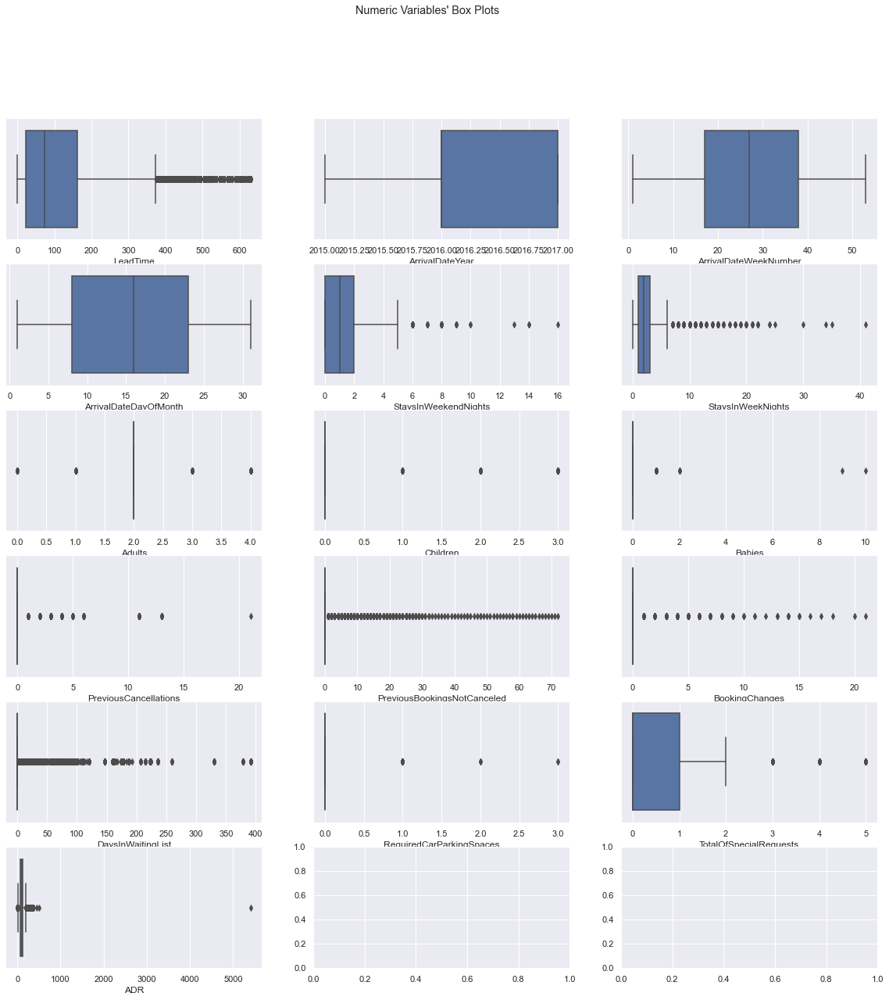

In [13]:
# All Numeric Variables' Box Plots in one figure
sns.set()

fig, axes = plt.subplots(6, ceil(len(num_discrete+num_continuous) / 6), figsize=(20, 20))

for ax, feat in zip(axes.flatten(), num_discrete+num_continuous):
    sns.boxplot(x=df_original[feat], ax=ax)
    
title = "Numeric Variables' Box Plots"

plt.suptitle(title)
plt.show()

<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - Leadtime, PreviousCancellations, ADR, PreviousBookingsNotCanceled, DaysInWaitingList AND BookingChanges: presence of outliers <br>
    - ArrivalDateYear, ArrivalDateWeekNumber and ArrivalDateDayOfMonth are discrete and presents no outliers/inconsistent value <br>
    - StaysInWeekendNights and StaysInWeekNights present big numbers that might represent inconsistency <br>
    - Adults=0 might be some inconsitency as well. Mainly when combined with Children/Babies>0 <br>
    - Babies>8 migh also represent inconsistency <br>
    - Considering the characteristic of the dataset which contains a large number of nominal and discrete values, and few numeric-continuous variables with outliers, Decision Tree might be a possible and suitable machine learning method for the predictive model.
    
</div>

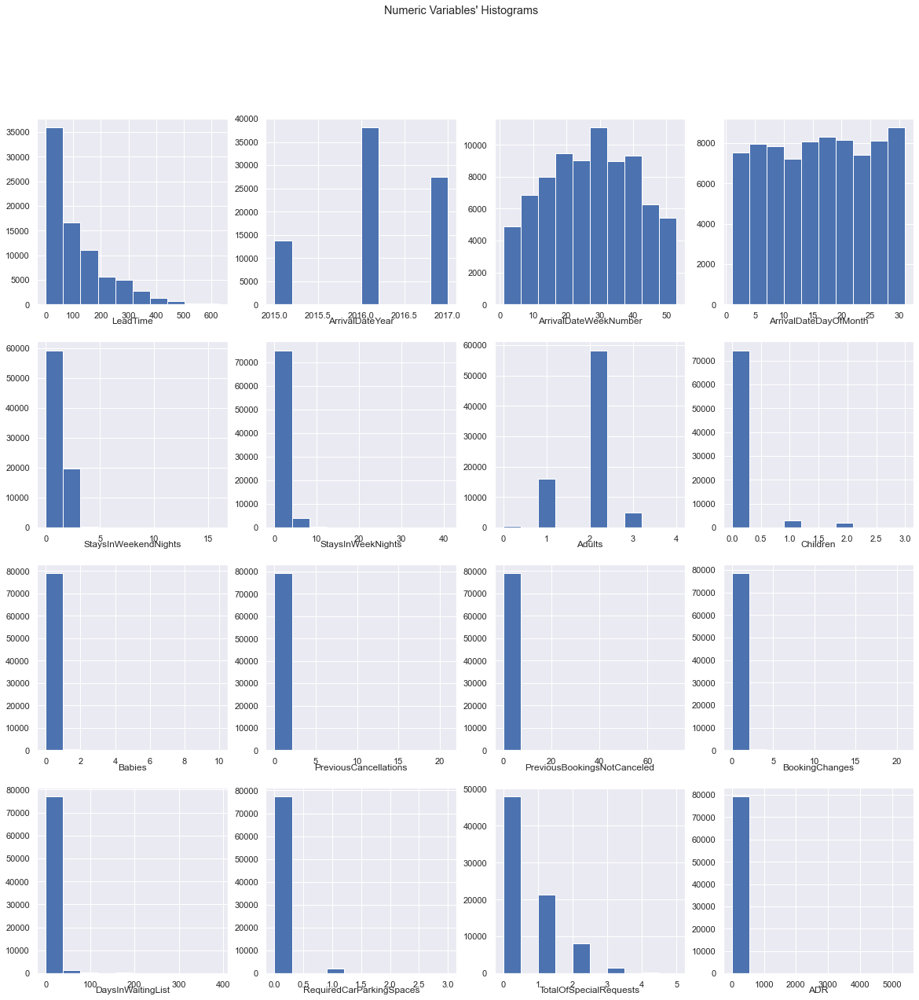

In [14]:
# All Numeric Variables' Histograms in one figure
sns.set()

fig, axes = plt.subplots(4, ceil(len(num_discrete+num_continuous) / 4), figsize=(20, 20))

for ax, feat in zip(axes.flatten(), num_discrete+num_continuous):
    ax.hist(df_original[feat])
    ax.set_title(feat, y=-0.13)

title = "Numeric Variables' Histograms"

plt.suptitle(title)
plt.show()

<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - Some numeric variables are skewed distributions. After outlier removal, a log scaling method could be applied to bring the distributions closer to Gaussian Distributions.
    
</div>

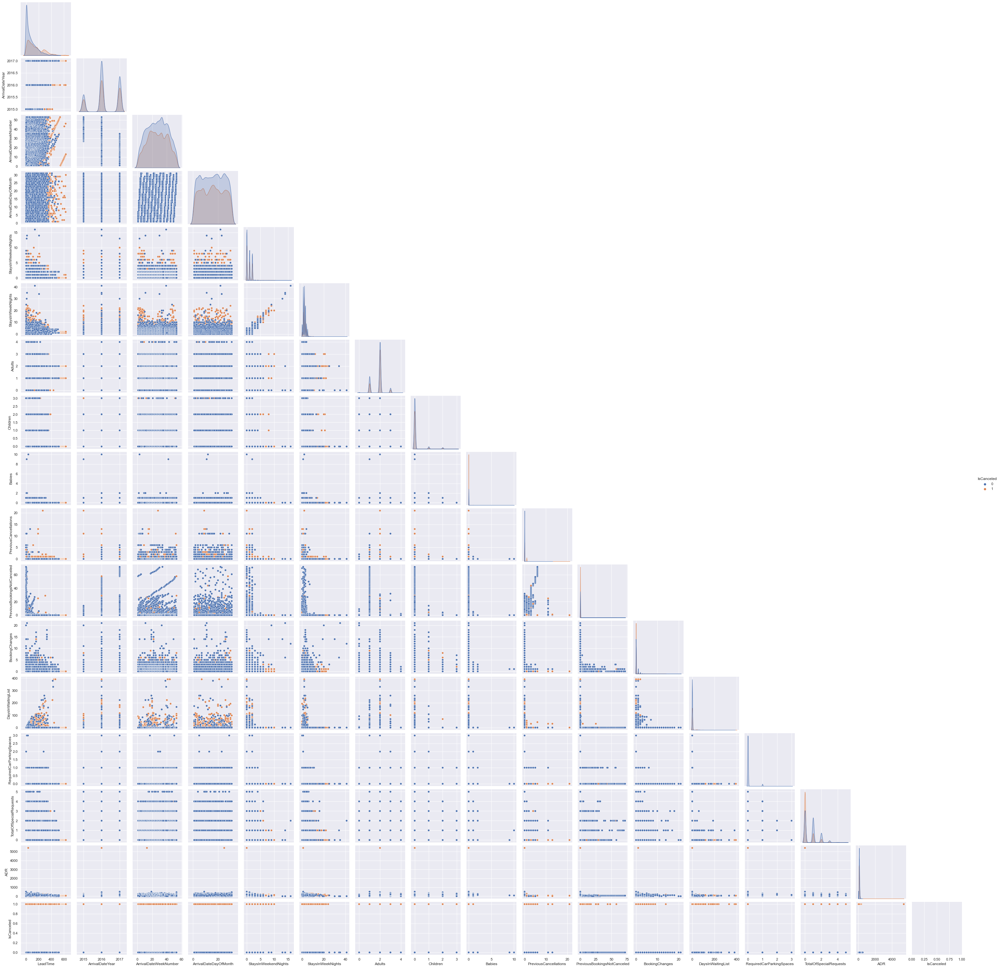

In [15]:
# sns_plot = sns.pairplot(data=df_original[num_discrete+num_continuous+target], corner= True, hue= 'IsCanceled', vars=df_original[num_discrete+num_continuous+target])
# sns_plot.savefig('pairplot.png')
# ##plt.clf()
# plt.show()
pairplot_image = Image.open('pairplot.png')
pairplot_image

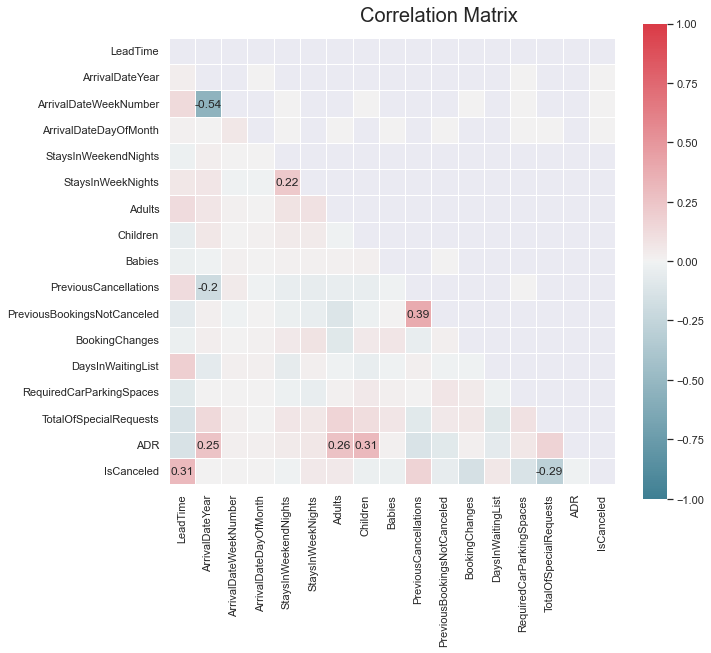

In [16]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(df_original[num_discrete+num_continuous+target].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.2
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))
matrix = np.triu(corr) # take upper correlation matrix

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5, mask=matrix)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - There isn`t any highly correlated variable pairwise <br>
    - LeadTime has a low positive correlation with IsCanceled (target) <br>
    - ArrivalDateYear has a Moderate negative correlation with ArrivalDateWeeknumber. This is probably due to the big difference between the only three years (2015,2016,2017) and the week numbers (1 to 53 only) <br>
    - Children has a low positive correlation with ADR <br>
    - PreviousCancellations has a low positive correlation with PreviousBookingsNotCanceled <br>
    - TotalOfSpecialRequests has a low negative correlation with IsCanceled   
    
</div>

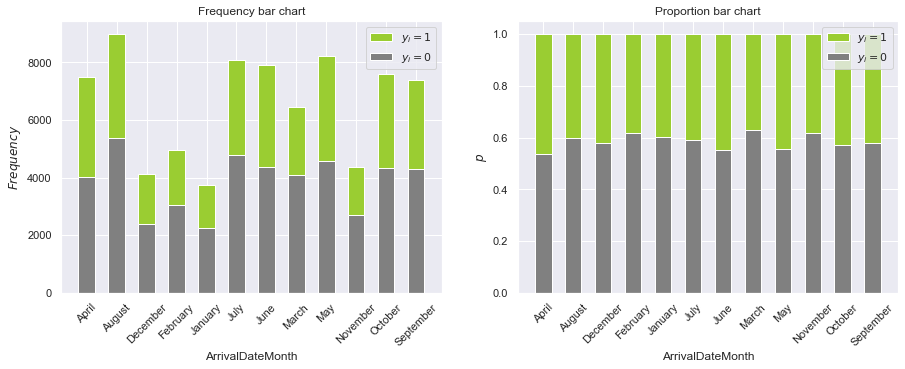

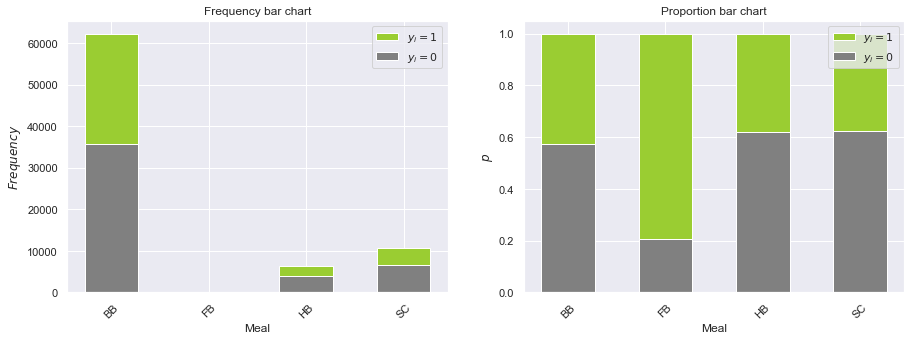

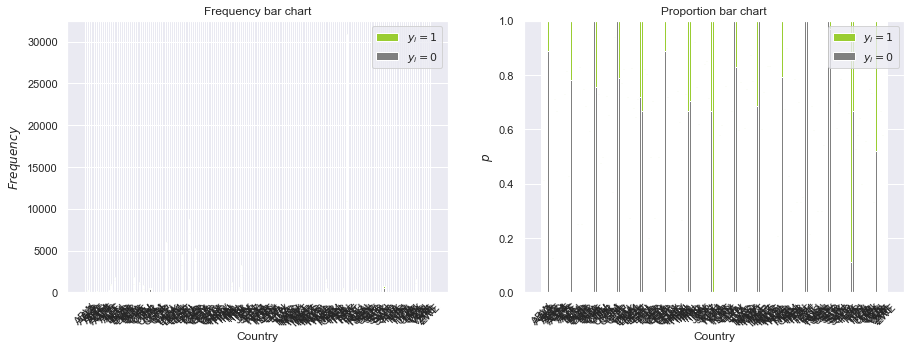

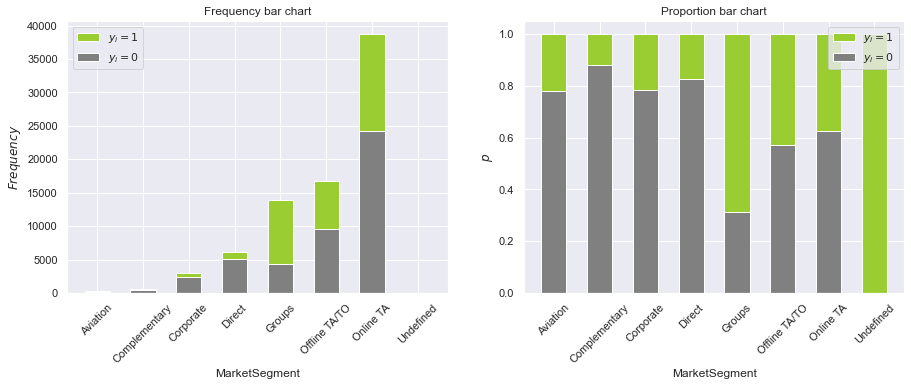

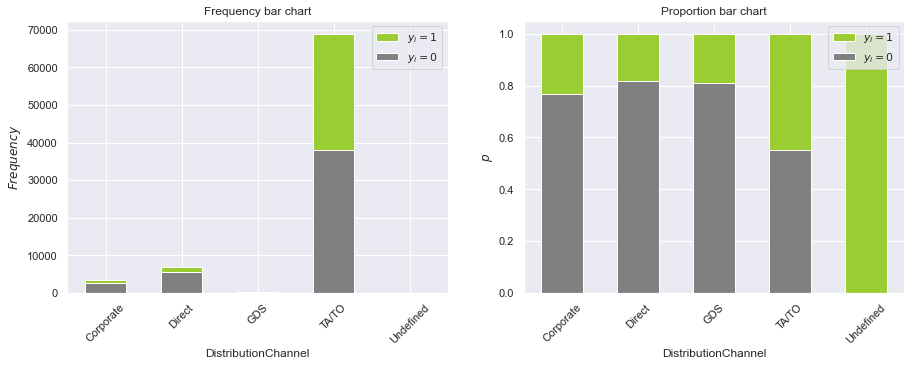

...

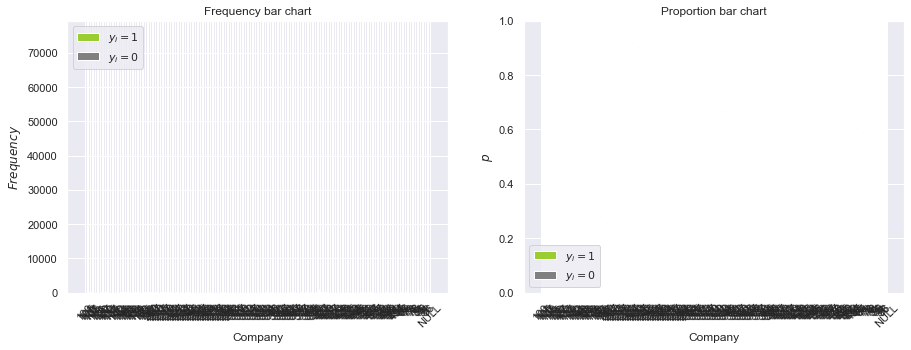

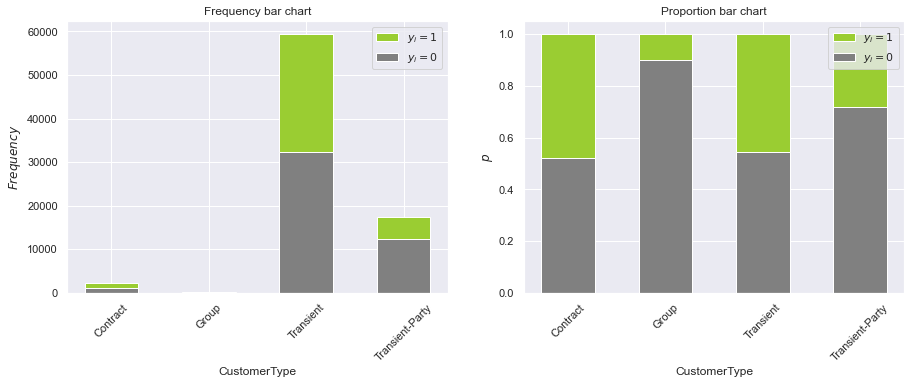

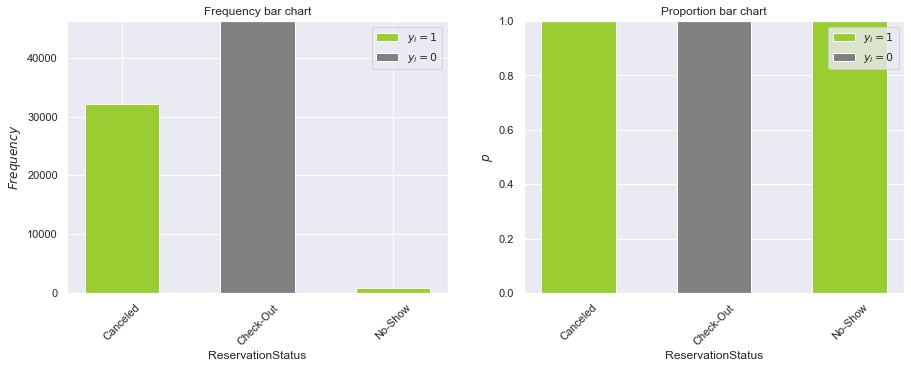

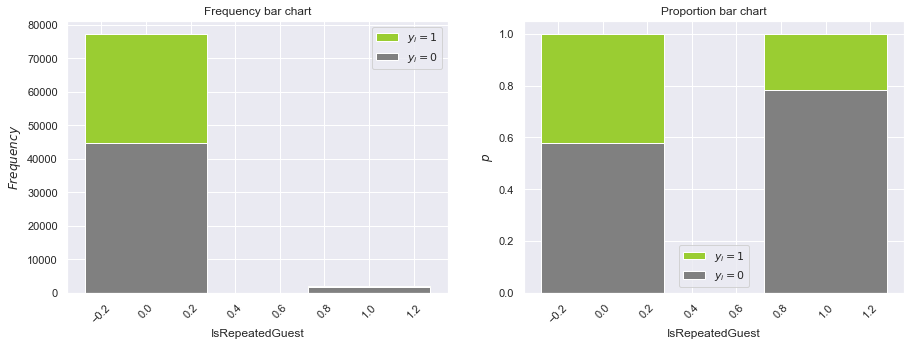

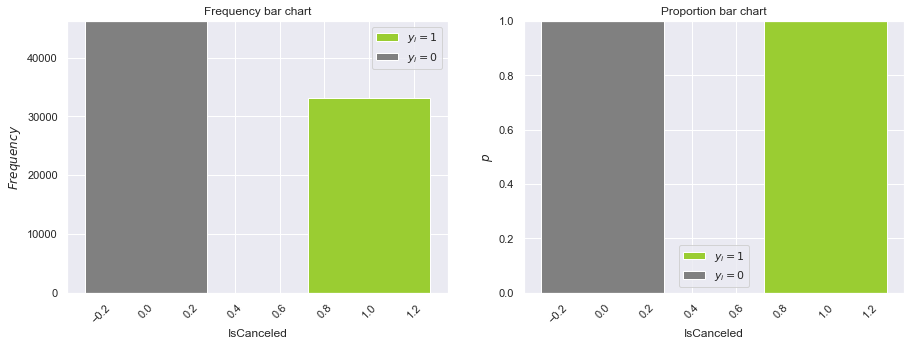

In [17]:
def bar_charts_categorical(df, feature, target):
    cont_tab = pd.crosstab(df[feature], df[target], margins = True)
    categories = cont_tab.index[:-1]
        
    fig = plt.figure(figsize=(15, 5))
    
    plt.subplot(121)
    p1 = plt.bar(categories, cont_tab.iloc[:-1, 0].values, 0.55, color="gray")
    p2 = plt.bar(categories, cont_tab.iloc[:-1, 1].values, 0.55, bottom=cont_tab.iloc[:-1, 0], color="yellowgreen")
    plt.legend((p2[0], p1[0]), ('$y_i=1$', '$y_i=0$'))
    plt.title("Frequency bar chart")
    plt.xlabel(feature)
    plt.xticks(rotation=45)
    plt.ylabel("$Frequency$")

   
    obs_pct = np.array([np.divide(cont_tab.iloc[:-1, 0].values, cont_tab.iloc[:-1, 2].values), 
                         np.divide(cont_tab.iloc[:-1, 1].values, cont_tab.iloc[:-1, 2].values)])
      
    plt.subplot(122)
    p1 = plt.bar(categories, obs_pct[0], 0.55, color="gray")
    p2 = plt.bar(categories, obs_pct[1], 0.55, bottom=obs_pct[0], color="yellowgreen")
    plt.legend((p2[0], p1[0]), ('$y_i=1$', '$y_i=0$'))
    plt.title("Proportion bar chart")
    plt.xlabel(feature)
    plt.xticks(rotation=45)
    plt.ylabel("$p$")

    plt.show()  
    
for i in range(len(df_original[cat_nominal+num_discrete_binary+target].columns)):
     bar_charts_categorical(df=df_original[cat_nominal+num_discrete_binary+target],target="IsCanceled",feature=df_original[cat_nominal+num_discrete_binary+target].columns[i])

In [18]:
# Checking how many Undefined entries for DistributionChannel
df_original['DistributionChannel'].value_counts()

TA/TO        68945
Direct        6780
Corporate     3408
GDS            193
Undefined        4
Name: DistributionChannel, dtype: int64

<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - Variable DistributionChannel has a category Undefined which doesn`t add information to the dataset. Since there are only 4 occurrences of this category, those rows can be dropped <br>
    - For the variable MarketSegment: category group is slightly more inclined to cancelation than the others categories <br>
    - DepositType has a category named No Deposit which shows only cancelled bookings. The downside is that the frequency of this category is low.
    - Better visualization technique required for Agent, Company and Country
    
    
</div>

<div class="alert alert-block alert-info">
<a class="anchor" id="five-bullet">     

# 2. Data Preparation
</a>    
</div>

In [19]:
# Creating a copy of the original dataset
df_prep = df_original.copy()

### `Data Cleaning` <a id="six-bullet"></a>

__Removing Duplicates__

In [20]:
df_prep.drop_duplicates(keep='first', inplace=True, ignore_index=False)
print('New duplicates check/qty:',df_prep.duplicated().sum(),'-', 'Percentage of data kept after removing outliers and missing values:', np.round(df_prep.shape[0] / df_original.shape[0], 4))

New duplicates check/qty: 0 - Percentage of data kept after removing outliers and missing values: 0.6735


__Dropping Missing Values__

In [21]:
# Dropping Missing Values
df_prep.dropna(inplace=True)
print(df_prep.isna().sum(),'\n\n Percentage of data kept after removing outliers and missing values:', np.round(df_prep.shape[0] / df_original.shape[0], 4))

IsCanceled                     0
LeadTime                       0
ArrivalDateYear                0
ArrivalDateMonth               0
ArrivalDateWeekNumber          0
ArrivalDateDayOfMonth          0
StaysInWeekendNights           0
StaysInWeekNights              0
Adults                         0
Children                       0
Babies                         0
Meal                           0
Country                        0
MarketSegment                  0
DistributionChannel            0
IsRepeatedGuest                0
PreviousCancellations          0
PreviousBookingsNotCanceled    0
ReservedRoomType               0
AssignedRoomType               0
BookingChanges                 0
DepositType                    0
Agent                          0
Company                        0
DaysInWaitingList              0
CustomerType                   0
ADR                            0
RequiredCarParkingSpaces       0
TotalOfSpecialRequests         0
ReservationStatus              0
Reservatio

__Outliers Removal__

In [22]:
df_prep_two = df_prep.copy()

In [23]:
# Outliers Manual Removal
outliers_filters = (
    (df_prep_two['ADR']<=350)
    &
    (df_prep_two['ADR']>10)
    &
    (df_prep_two['LeadTime']<500)
    &
    (df_prep_two['Adults']>0)
    &
    (df_prep_two['Babies']<=8)
    &
    (df_prep_two['DaysInWaitingList']<=140)
    &
    (df_prep_two['StaysInWeekNights']<=30)
    &
    (df_prep_two['PreviousCancellations']<10)
)

df_prep_two = df_prep_two[outliers_filters]

print('Percentage of data kept after removing outliers and missing values:', np.round(df_prep_two.shape[0] / df_prep.shape[0], 4))

Percentage of data kept after removing outliers and missing values: 0.9701


__Dropping Undefined Category for Variable DistributionChannel__

In [24]:
#define values to drop
values_to_drop = ['Undefined']

#drop rows that contain any value in the list
df_prep_two = df_prep_two[df_prep_two.DistributionChannel.isin(values_to_drop) == False]

# Checking how many Undefined entries for DistributionChannel
df_prep_two['DistributionChannel'].value_counts()

TA/TO        43617
Direct        5529
Corporate     2500
GDS            175
Name: DistributionChannel, dtype: int64

In [25]:
df_prep_two

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
1,1,88,2015,July,27,1,0,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.50,0,1,Canceled,2015-07-01
2,1,65,2015,July,27,1,0,4,1,0.0,...,No Deposit,9,NULL,0,Transient,68.00,0,1,Canceled,2015-04-30
3,1,92,2015,July,27,1,2,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.50,0,2,Canceled,2015-06-23
4,1,100,2015,July,27,2,0,2,2,0.0,...,No Deposit,9,NULL,0,Transient,76.50,0,1,Canceled,2015-04-02
5,1,79,2015,July,27,2,0,3,2,0.0,...,No Deposit,9,NULL,0,Transient,76.50,0,1,Canceled,2015-06-25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79325,0,23,2017,August,35,30,2,5,2,0.0,...,No Deposit,394,NULL,0,Transient,96.14,0,0,Check-Out,2017-09-06
79326,0,102,2017,August,35,31,2,5,3,0.0,...,No Deposit,9,NULL,0,Transient,225.43,0,2,Check-Out,2017-09-07
79327,0,34,2017,August,35,31,2,5,2,0.0,...,No Deposit,9,NULL,0,Transient,157.71,0,4,Check-Out,2017-09-07
79328,0,109,2017,August,35,31,2,5,2,0.0,...,No Deposit,89,NULL,0,Transient,104.40,0,0,Check-Out,2017-09-07


__Changing the ReservationStatusDate data type from Object to pandas DateTime__

In [26]:
# Changing the ReservationStatusDate to date type
df_prep_two['ReservationStatusDate'] = pd.to_datetime(df_prep_two['ReservationStatusDate'])
df_prep_two.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51821 entries, 1 to 79329
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   IsCanceled                   51821 non-null  int64         
 1   LeadTime                     51821 non-null  int64         
 2   ArrivalDateYear              51821 non-null  int64         
 3   ArrivalDateMonth             51821 non-null  object        
 4   ArrivalDateWeekNumber        51821 non-null  int64         
 5   ArrivalDateDayOfMonth        51821 non-null  int64         
 6   StaysInWeekendNights         51821 non-null  int64         
 7   StaysInWeekNights            51821 non-null  int64         
 8   Adults                       51821 non-null  int64         
 9   Children                     51821 non-null  float64       
 10  Babies                       51821 non-null  int64         
 11  Meal                         51821 non-nu

### `Feature Engineering` <a id="seven-bullet"></a>

__Creating new features from the original ones__

In [27]:
# Adding the feature ArrivalDate
columns = ['ArrivalDateYear','ArrivalDateMonth','ArrivalDateDayOfMonth']
df_prep_two['ArrivalDate'] = pd.to_datetime(df_prep_two[columns].apply(lambda x: '-'.join(x.values.astype(str)), axis="columns"))

#Creating feature days in between
df_prep_two['DaysBetween'] = df_prep_two['ArrivalDate'] - df_prep_two['ReservationStatusDate']
df_prep_two['DaysBetween'] = df_prep_two['DaysBetween'].astype(str)
df_prep_two['DaysBetween'] = df_prep_two['DaysBetween'].str.split(' ').str[0]
df_prep_two['DaysBetween'] = df_prep_two['DaysBetween'].astype(int)

#Creating feature TotalPreviousBookings
df_prep_two['TotalPreviousBookings'] = df_prep_two['PreviousCancellations'] + df_prep_two['PreviousBookingsNotCanceled']

df_prep_two.head(3)

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate,ArrivalDate,DaysBetween,TotalPreviousBookings
1,1,88,2015,July,27,1,0,4,2,0.0,...,0,Transient,76.5,0,1,Canceled,2015-07-01,2015-07-01,0,0
2,1,65,2015,July,27,1,0,4,1,0.0,...,0,Transient,68.0,0,1,Canceled,2015-04-30,2015-07-01,62,0
3,1,92,2015,July,27,1,2,4,2,0.0,...,0,Transient,76.5,0,2,Canceled,2015-06-23,2015-07-01,8,0


In [28]:
# Updating the variables lists

cat_nominal = ['ArrivalDateMonth',
               'Meal',
               'Country',
               'MarketSegment',
               'DistributionChannel',
               'ReservedRoomType',
               'AssignedRoomType',
               'DepositType',
               'Agent',
               'Company',
               'CustomerType',
               'ReservationStatus'
              ]

num_discrete = ['LeadTime',
                'ArrivalDateYear',                
                'ArrivalDateWeekNumber',
                'ArrivalDateDayOfMonth',
                'StaysInWeekendNights',
                'StaysInWeekNights',
                'Adults',
                'Children',
                'Babies',                
                'PreviousCancellations',
                'PreviousBookingsNotCanceled',
                'BookingChanges',
                'DaysInWaitingList',
                'RequiredCarParkingSpaces',
                'TotalOfSpecialRequests',
                'DaysBetween',
                'TotalPreviousBookings'
               ]

num_continuous = ['ADR']

num_discrete_binary = ['IsRepeatedGuest']

date = ['ReservationStatusDate','ArrivalDate']

target = ['IsCanceled']

all_variables = cat_nominal+num_discrete+num_continuous+num_discrete_binary+date+target

print('Total number of variables assigned to lists: ',len(all_variables))

Total number of variables assigned to lists:  34


__Applying Log Transformations to Skewed-Distributed Numeric Features__

In [29]:
df_prep_three = df_prep_two.copy()

In [30]:
# Log Transformation to LeadTime
scaler = PowerTransformer()
scaled_feat = scaler.fit_transform(df_prep_three[['LeadTime']])
df_prep_three['LeadTime_log'] = scaled_feat
df_prep_three.head(3)

# Log Transformation to ADR
scaler = PowerTransformer()
scaled_feat = scaler.fit_transform(df_prep_three[['ADR']])
df_prep_three['ADR_log'] = scaled_feat
df_prep_three.head(3)

# Log Transformation to DaysBetween
scaler = PowerTransformer()
scaled_feat = scaler.fit_transform(df_prep_three[['DaysBetween']])
df_prep_three['DaysBetween_log'] = scaled_feat
df_prep_three.head(3)

# Log Transformation to StaysInWeekNights
scaler = PowerTransformer()
scaled_feat = scaler.fit_transform(df_prep_three[['StaysInWeekNights']])
df_prep_three['StaysInWeekNights_log'] = scaled_feat
df_prep_three.head(3)

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate,ArrivalDate,DaysBetween,TotalPreviousBookings,LeadTime_log,ADR_log,DaysBetween_log,StaysInWeekNights_log
1,1,88,2015,July,27,1,0,4,2,0.0,...,1,Canceled,2015-07-01,2015-07-01,0,0,0.509657,-1.004226,0.279918,1.141999
2,1,65,2015,July,27,1,0,4,1,0.0,...,1,Canceled,2015-04-30,2015-07-01,62,0,0.249415,-1.333552,1.362336,1.141999
3,1,92,2015,July,27,1,2,4,2,0.0,...,2,Canceled,2015-06-23,2015-07-01,8,0,0.549679,-1.004226,0.678621,1.141999


In [31]:
# Updating the variables list

num_discrete = ['LeadTime',
                'ArrivalDateYear',                
                'ArrivalDateWeekNumber',
                'ArrivalDateDayOfMonth',
                'StaysInWeekendNights',
                'StaysInWeekNights',
                'Adults',
                'Children',
                'Babies',                
                'PreviousCancellations',
                'PreviousBookingsNotCanceled',
                'BookingChanges',
                'DaysInWaitingList',
                'RequiredCarParkingSpaces',
                'TotalOfSpecialRequests',
                'DaysBetween',
                'TotalPreviousBookings',
                'LeadTime_log',
                'DaysBetween_log',
                'StaysInWeekNights_log'
               ]

num_continuous = ['ADR','ADR_log']

all_variables = cat_nominal+num_discrete+num_continuous+num_discrete_binary+date+target

### `Data Exploration Revisit` <a id="eight-bullet"></a>

In [32]:
# Manual Removing the outliers for DaysBetween_log
outliers_filters = (
    (df_prep_three['DaysBetween_log']>-6)
)

df_prep_three = df_prep_three[outliers_filters]

print('Percentage of data kept after removing outliers and missing values:', np.round(df_prep_three.shape[0] / df_prep_two.shape[0], 4))

Percentage of data kept after removing outliers and missing values: 0.9989


In [33]:
# descriptive statistics for metric features
variables_to_use = num_discrete + num_continuous + num_discrete_binary + target

df_prep_three[variables_to_use].describe(include="all").T

,count,mean,std,min,25%,50%,75%,max
LeadTime,51764.0,77.528302,79.775271,0.000000,14.000000,52.000000,118.000000,496.000000
ArrivalDateYear,51764.0,2016.261012,0.657280,2015.000000,2016.000000,2016.000000,2017.000000,2017.000000
ArrivalDateWeekNumber,51764.0,26.609130,13.537980,1.000000,16.000000,27.000000,37.000000,53.000000
ArrivalDateDayOfMonth,51764.0,15.774283,8.804580,1.000000,8.000000,16.000000,23.000000,31.000000
StaysInWeekendNights,51764.0,0.877965,0.896129,0.000000,0.000000,1.000000,2.000000,10.000000
StaysInWeekNights,51764.0,2.283653,1.552090,0.000000,1.000000,2.000000,3.000000,24.000000
Adults,51764.0,1.898462,0.519398,1.000000,2.000000,2.000000,2.000000,4.000000
Children,51764.0,0.125995,0.428724,0.000000,0.000000,0.000000,0.000000,3.000000
Babies,51764.0,0.006742,0.083238,0.000000,0.000000,0.000000,0.000000,2.000000
PreviousCancellations,51764.0,0.026292,0.221744,0.000000,0.000000,0.000000,0.000000,6.000000


In [34]:
# Checking how many days in advance the booking is canceled compared to the arrival date 
df_prep_three[['ReservationStatus','DaysBetween']].groupby(['ReservationStatus']).mean()

,DaysBetween
ReservationStatus,
Canceled,62.546435
Check-Out,-3.002166
No-Show,0.000000


In [35]:
# Checking how many days in advance the booking is canceled compared to the arrival date 
df_prep_three[['ReservationStatus','TotalPreviousBookings']].groupby(['ReservationStatus']).mean()

,TotalPreviousBookings
ReservationStatus,
Canceled,0.082485
Check-Out,0.235451
No-Show,0.144429


<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - On average, guests book their rooms with 77.51 days in advance <br>
    - Only 2.5% are repeated guests <br>
    - __`30.39%`__ of the bookings from this dataset got canceled (cancelation or no show). This shows a imbalanced dataset, some balance method might me necessary depending on the modeling method that will be used <br>
    - Adults has a mean of 1.90, with a minimum of 1 and a maximum of 4 <br>
    - Babies has a mean of 0.007, showing that most of reversations are for people without babies. The maximum is 2 <br>
    - PreviousCancellations has a men of 0.026, which shows that the majority of reservations/guests haven't canceled before <br>
    - PreviousBookingsNotCanceled has a mean of 0.16. <br>
    - RequiredCarParkingSpaces has a low mean of 0.03, showing that the majority of guests stays in the hotel without cars <br>
    - The Average daily rate (ADR) 113.57 <br>
    - The mean for DaysBetween 16.02. When canceled in advance, the avg is 62.54 days in advance.
    
</div>

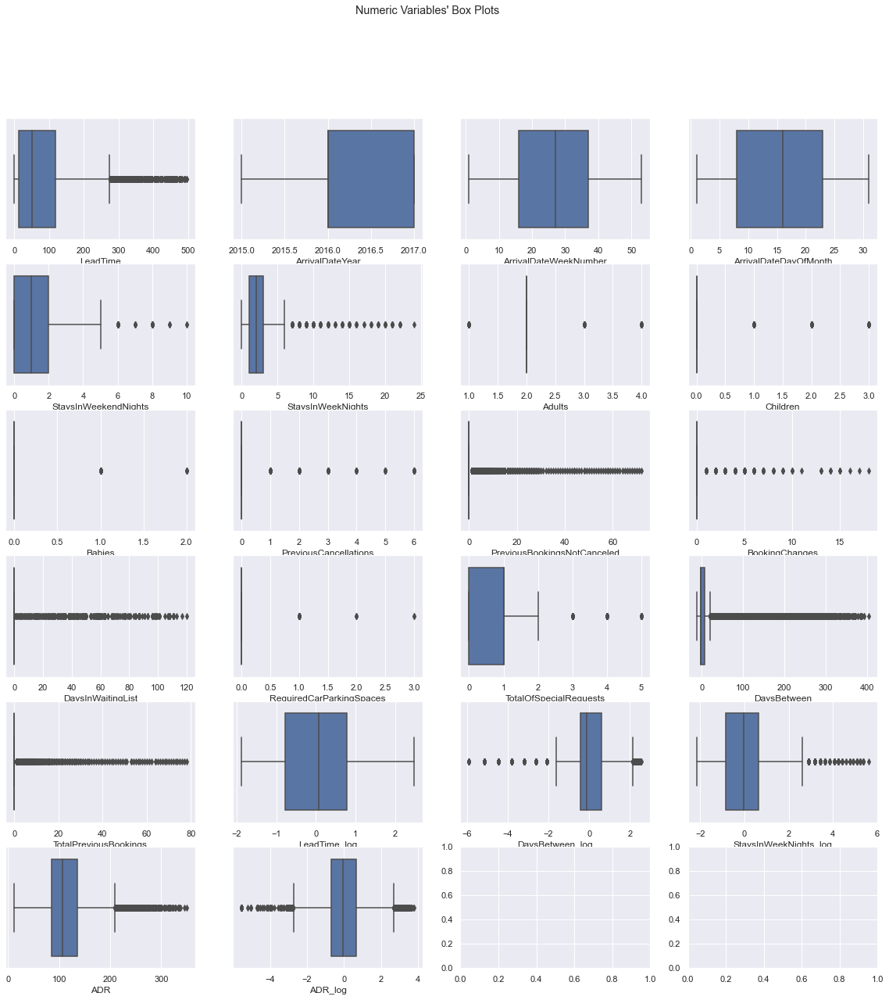

In [36]:
# All Numeric Variables' Box Plots in one figure
sns.set()

fig, axes = plt.subplots(6, ceil(len(num_discrete+num_continuous) / 6), figsize=(20, 20))

for ax, feat in zip(axes.flatten(), num_discrete+num_continuous):
    sns.boxplot(x=df_prep_three[feat], ax=ax)
    
title = "Numeric Variables' Box Plots"

plt.suptitle(title)
plt.show()

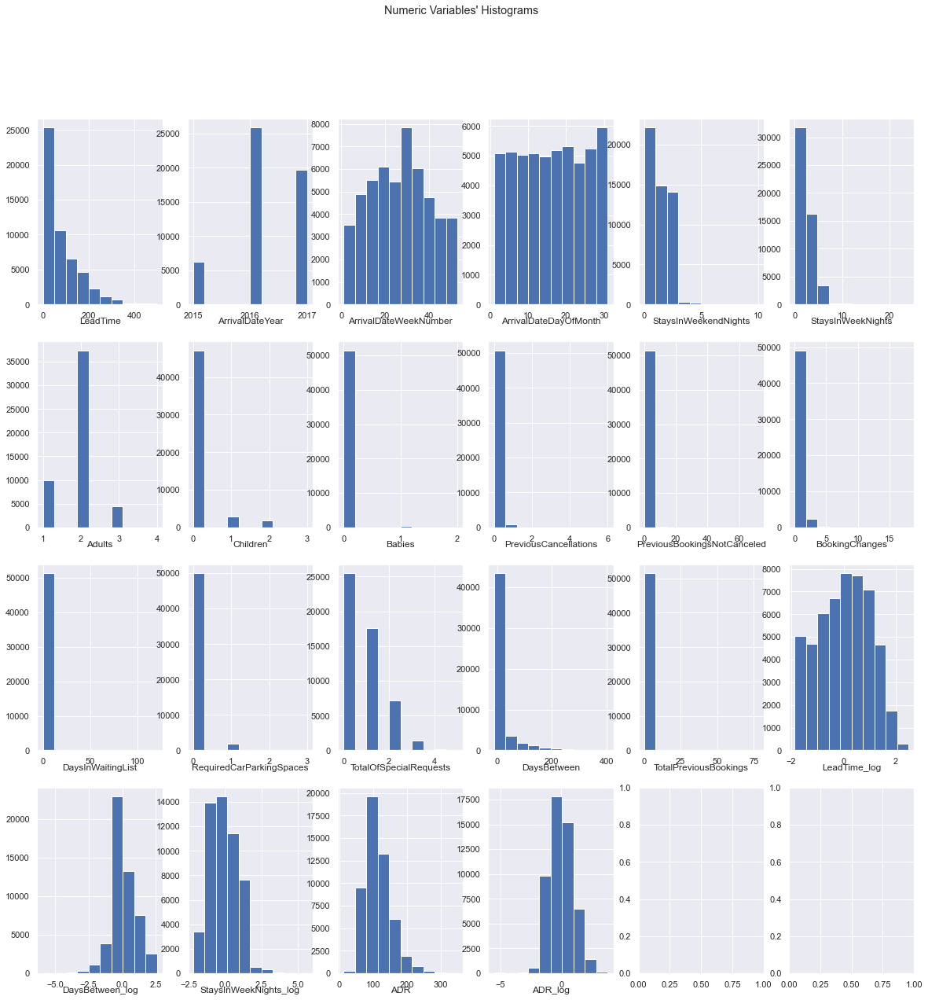

In [37]:
# All Numeric Variables' Histograms in one figure
sns.set()

fig, axes = plt.subplots(4, ceil(len(num_discrete+num_continuous) / 4), figsize=(20, 20))

for ax, feat in zip(axes.flatten(), num_discrete+num_continuous):
    ax.hist(df_prep_three[feat])
    ax.set_title(feat, y=-0.13)

title = "Numeric Variables' Histograms"

plt.suptitle(title)
plt.show()

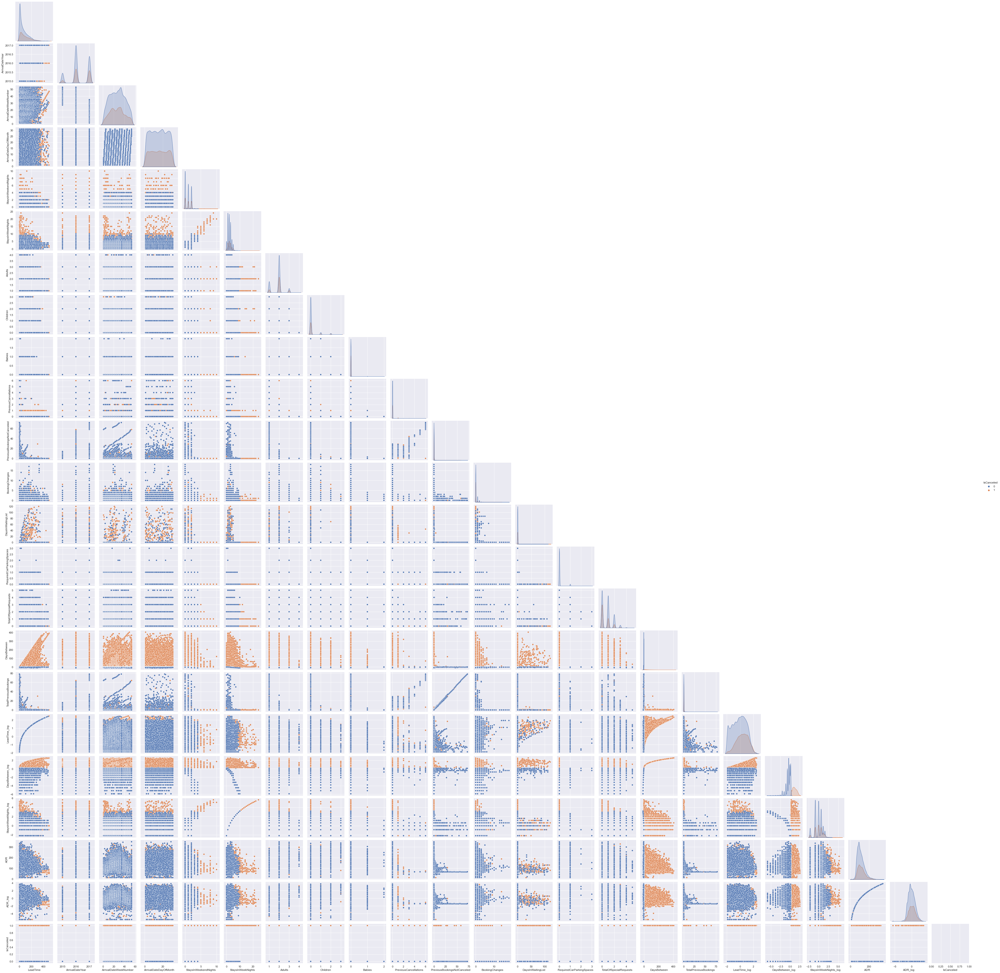

In [38]:
# sns_plot = sns.pairplot(data=df_prep_three[num_discrete+num_continuous+target], corner= True, hue= 'IsCanceled', vars=df_prep_three[num_discrete+num_continuous+target])
# sns_plot.savefig('pairplot_df_prep_three.png')
# ##plt.clf()
# plt.show()

pairplot_image = Image.open('pairplot_df_prep_three.png')
pairplot_image

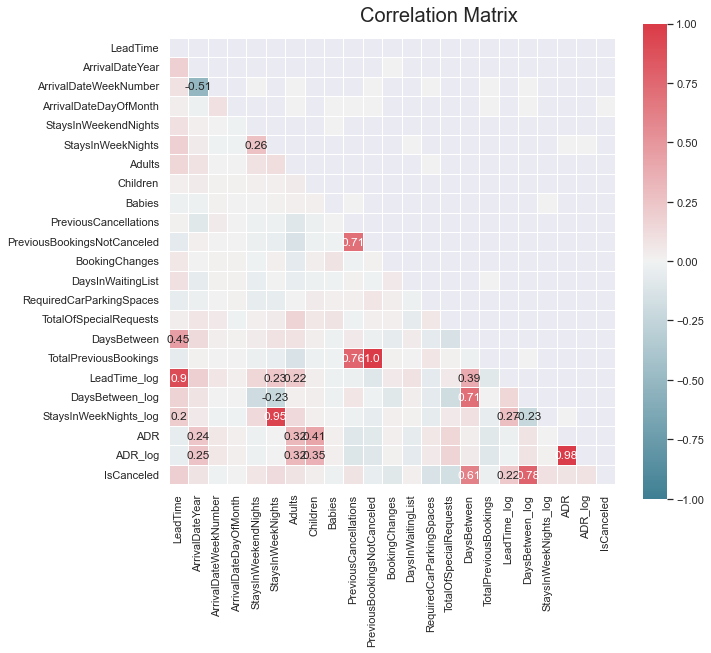

In [39]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(df_prep_three[num_discrete+num_continuous+target].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.2
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))
matrix = np.triu(corr) # take upper correlation matrix

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5, mask=matrix)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - DaysBetween might be a leakage, since its value is only known after the last booking status update which is either the cancelation or the check-out. It is recommended to drop this variable <br>
    - LeadTime has a Strong positive correlation with LeadTime_log (Self-explanatory). Since LeadTime_log has a more gaussian distribution and its correlation to the target is higher, we will keep the former and drop the prime <br>
    - ArrivalDateYear has a Moderate negative correlation with ArrivalDateWeeknumber. This is probably due to the big difference between the only three years (2015,2016,2017) and the week numbers (1 to 53 only). Therefore, no conclusions of redundancy can be taken here <br>
    - StaysinWeeksNights has a strong positive correlation with StaysinWeeksNights_log (self-explanatory). Since StaysinWeeksNights_log has a more gaussian distribution we will keep the former and drop the prime <br>
    - Both Adults and Children has a low positive correlation with ADR and ADR_log <br>
    - TotalPreviousBookings has a High positive correlation with PreviousCancellations and PreviousBookingsNotCanceled. They are derivated, so it might be possible to keep only the TotalPreviousBookings

</div>

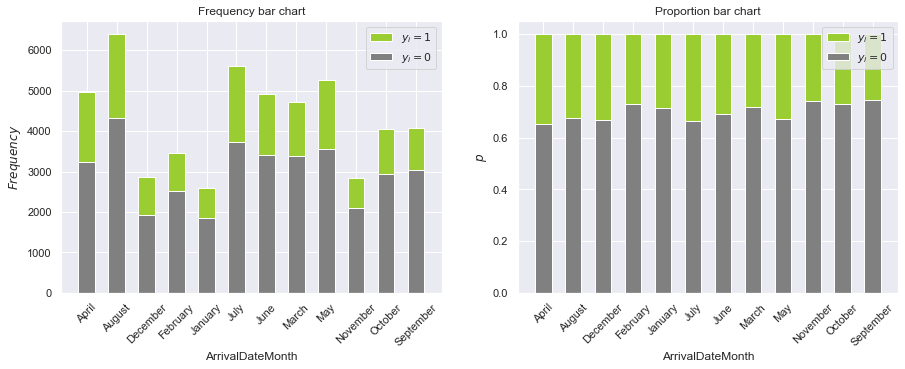

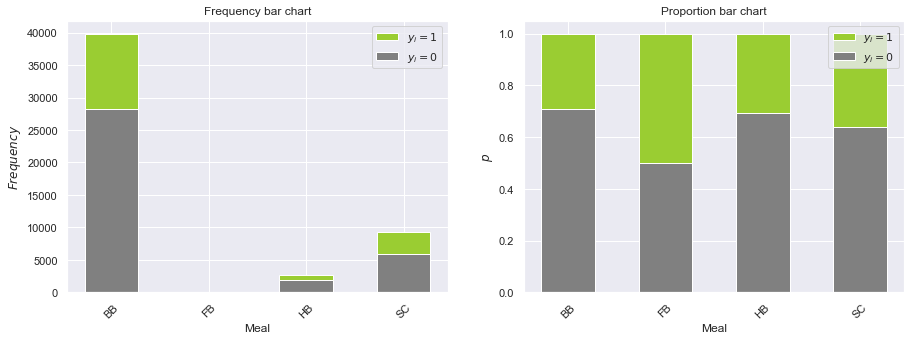

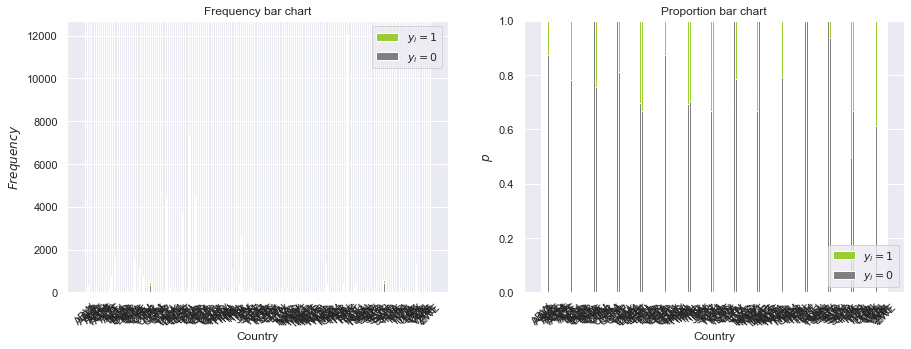

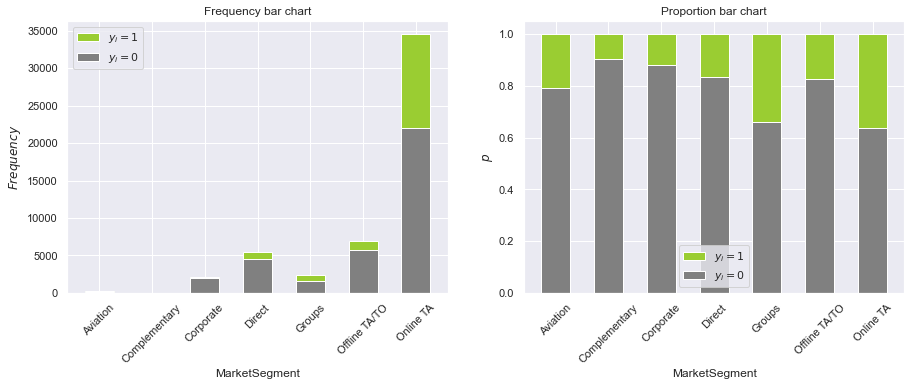

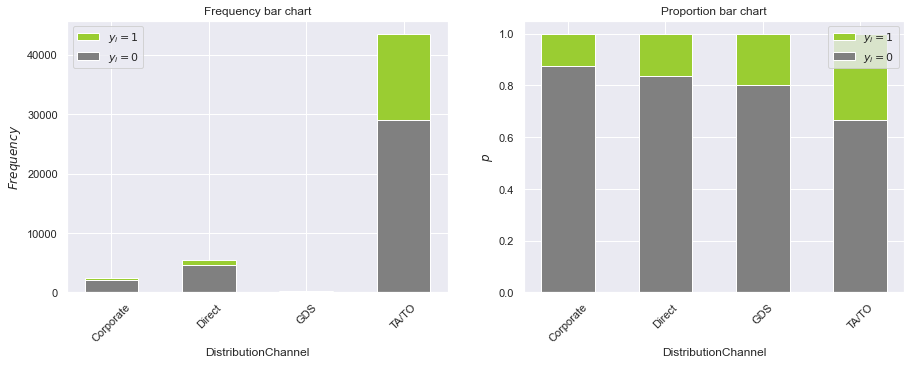

...

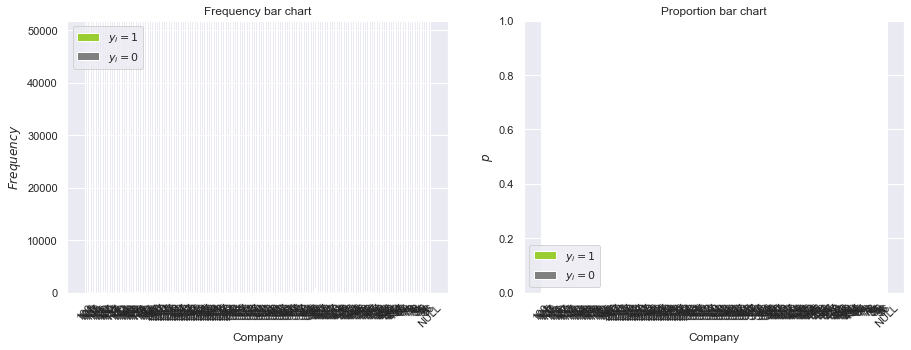

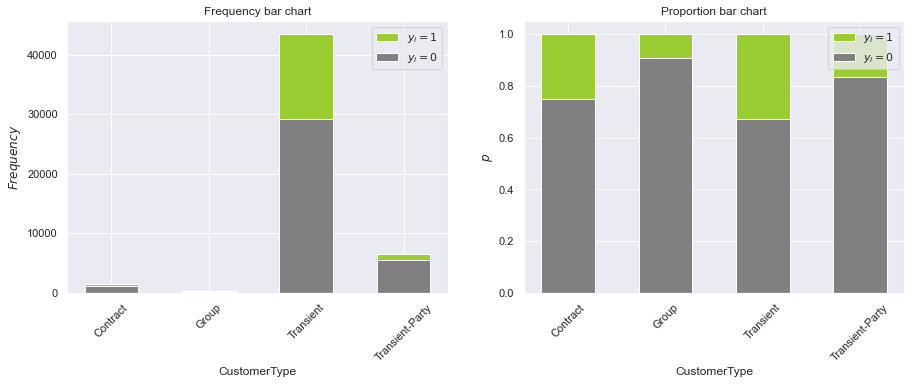

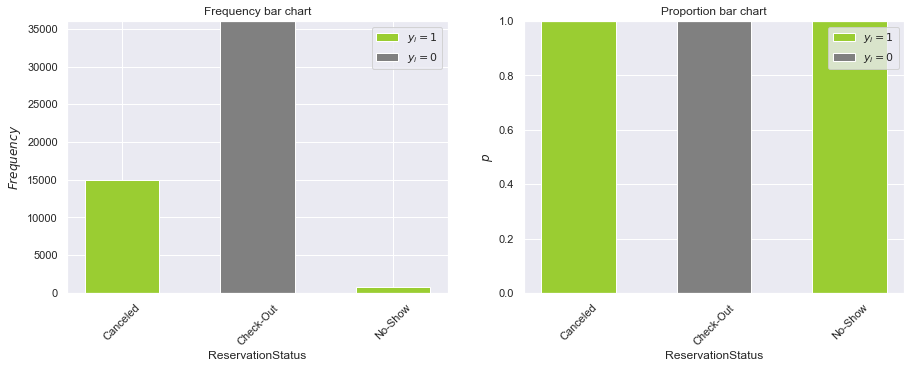

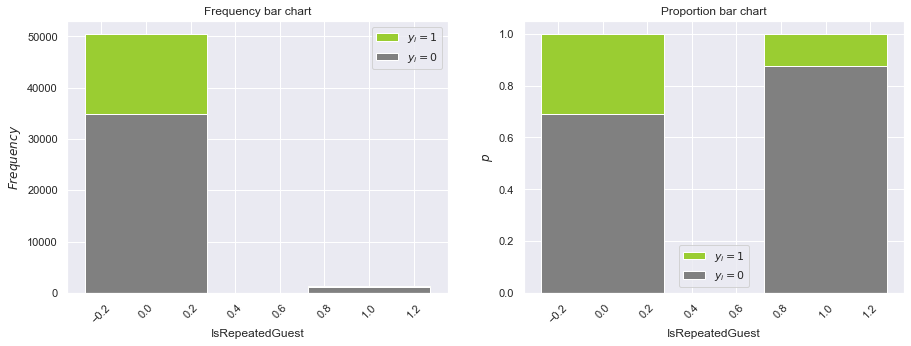

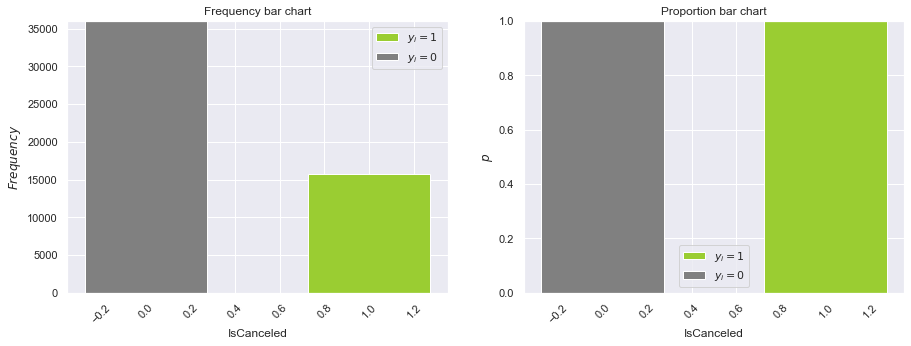

In [40]:
for i in range(len(df_prep_three[cat_nominal+num_discrete_binary+target].columns)):
     bar_charts_categorical(df=df_prep_three[cat_nominal+num_discrete_binary+target],target="IsCanceled",feature=df_prep_three[cat_nominal+num_discrete_binary+target].columns[i])

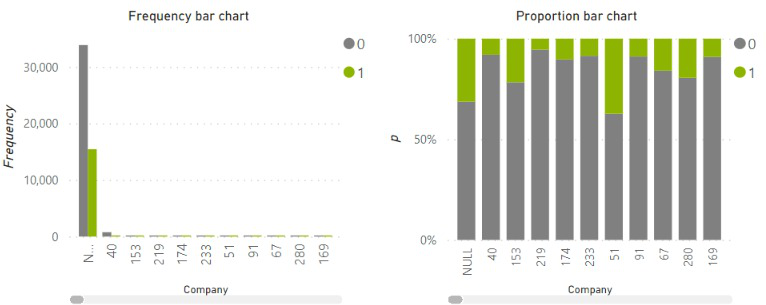

In [41]:
# This visual was done in PowerBI
pairplot_image_company = Image.open('Company_PBI_exp_revisit.jpeg')
pairplot_image_company

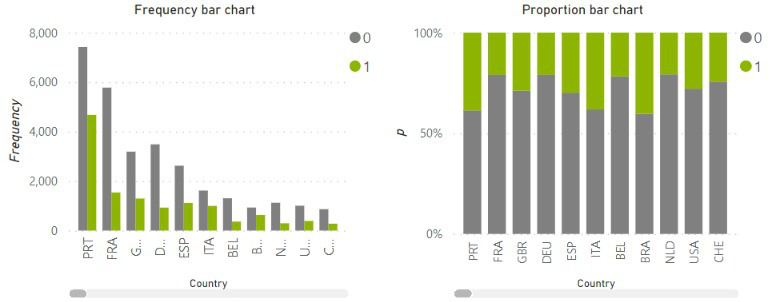

In [42]:
# This visual was done in PowerBI
pairplot_image_country = Image.open('Country_PBI_exp_revisit.jpeg')
pairplot_image_country

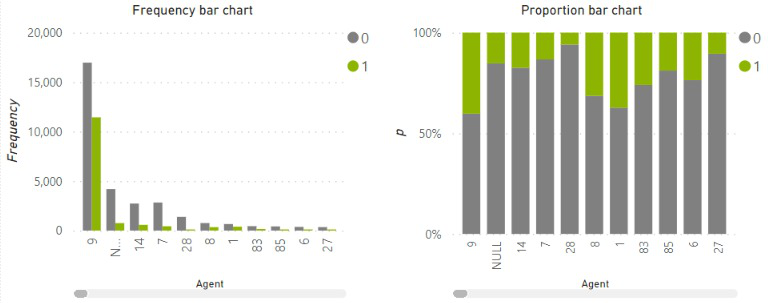

In [43]:
# This visual was done in PowerBI
pairplot_image_agent = Image.open('Agent_PBI_exp_revisit.jpeg')
pairplot_image_agent

<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - No visible trends identified in any of the categorical variables
    
</div>

In [44]:
df = df_prep_three

fig = px.histogram(df,
                   x='ArrivalDate', y='IsCanceled',
                   histfunc='count',
                   color='IsCanceled',
                   title='Bookings per Arrival Date',
                   labels={'ArrivalDate':'Date of Arrival'}
              )

fig.update_traces(xbins_size="M1")
fig.update_xaxes(showgrid=True, ticklabelmode="period", dtick="M1", tickformat="%b\n%Y")
fig.update_layout(bargap=0.1)
fig.show()

<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - It is visible that the booking requests increased from 2015 to 2017. But apperantly the proportion of canceled bookings reamined the same (or with a slight increase) <br>
    - We can see that for the months of Nov, Dec, Jan and Feb the quantity of bookings decreases, showing that the period of high demand goes from March to October.
    
</div>

### `Feature Selection` <a id="nine-bullet"></a>

__Removing obvious variables__

In [45]:
df_prep_four = df_prep_three.copy()

In [46]:
features_to_drop = ['DaysBetween',
                    'DaysBetween_log',
                    'ReservationStatusDate',
                    'ReservationStatus',
                    'LeadTime',
                    'ADR',
                    'StaysInWeekNights',
                    'ArrivalDate'
                   ]

df_prep_four.drop(features_to_drop, axis=1, inplace=True)
df_prep_four.head(3)

,IsCanceled,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,Adults,Children,Babies,Meal,...,Agent,Company,DaysInWaitingList,CustomerType,RequiredCarParkingSpaces,TotalOfSpecialRequests,TotalPreviousBookings,LeadTime_log,ADR_log,StaysInWeekNights_log
1,1,2015,July,27,1,0,2,0.0,0,BB,...,9,NULL,0,Transient,0,1,0,0.509657,-1.004226,1.141999
2,1,2015,July,27,1,0,1,0.0,0,BB,...,9,NULL,0,Transient,0,1,0,0.249415,-1.333552,1.141999
3,1,2015,July,27,1,2,2,0.0,0,BB,...,9,NULL,0,Transient,0,2,0,0.549679,-1.004226,1.141999


<div class="alert alert-block alert-success">
    
__Notes__: <br>
    - Why this variables were removed?
    
</div>

In [47]:
# Updating Lists
cat_nominal = ['ArrivalDateMonth',
               'Meal',
               'Country',
               'MarketSegment',
               'DistributionChannel',
               'ReservedRoomType',
               'AssignedRoomType',
               'DepositType',
               'Agent',
               'Company',
               'CustomerType'               
              ]

num_discrete = ['ArrivalDateYear',                
                'ArrivalDateWeekNumber',
                'ArrivalDateDayOfMonth',
                'StaysInWeekendNights',                
                'Adults',
                'Children',
                'Babies',                
                'PreviousCancellations',
                'PreviousBookingsNotCanceled',
                'BookingChanges',
                'DaysInWaitingList',
                'RequiredCarParkingSpaces',
                'TotalOfSpecialRequests',                
                'TotalPreviousBookings',
                'LeadTime_log',                
                'StaysInWeekNights_log'
               ]

num_continuous = ['ADR_log']

num_discrete_binary = ['IsRepeatedGuest']

target = ['IsCanceled']

all_variables = cat_nominal+num_discrete+num_continuous+num_discrete_binary+target

print('Total number of variables assigned to lists: ',len(all_variables))

Total number of variables assigned to lists:  30


__Scaling Numeric Features and Enconding Categorical Features__

In [48]:
df_prep_four_scaled = df_prep_four.copy()

In [49]:
# RobustScaler for Scaling numeric features
scaler = RobustScaler()
scaled_feat = scaler.fit_transform(df_prep_four_scaled[num_discrete+num_continuous])
df_prep_four_scaled[num_discrete+num_continuous] = scaled_feat
df_prep_four_scaled.head()

,IsCanceled,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,Adults,Children,Babies,Meal,...,Agent,Company,DaysInWaitingList,CustomerType,RequiredCarParkingSpaces,TotalOfSpecialRequests,TotalPreviousBookings,LeadTime_log,ADR_log,StaysInWeekNights_log
1,1,-1.0,July,0.0,-1.000000,-0.5,0.0,0.0,0.0,BB,...,9,NULL,0.0,Transient,0.0,0.0,0.0,0.281135,-0.716330,0.781513
2,1,-1.0,July,0.0,-1.000000,-0.5,-1.0,0.0,0.0,BB,...,9,NULL,0.0,Transient,0.0,0.0,0.0,0.114315,-0.959464,0.781513
3,1,-1.0,July,0.0,-1.000000,0.5,0.0,0.0,0.0,BB,...,9,NULL,0.0,Transient,0.0,1.0,0.0,0.306790,-0.716330,0.781513
4,1,-1.0,July,0.0,-0.933333,-0.5,0.0,0.0,0.0,BB,...,9,NULL,0.0,Transient,0.0,0.0,0.0,0.355754,-0.716330,0.000000
5,1,-1.0,July,0.0,-0.933333,-0.5,0.0,0.0,0.0,BB,...,9,NULL,0.0,Transient,0.0,0.0,0.0,0.220140,-0.716330,0.430889


__RFE for Numerical Features__

In [50]:
# Splitting the Dataset for the purpose of applying RFE

X = df_prep_four_scaled.drop('IsCanceled', axis = 1)
y = df_prep_four_scaled['IsCanceled']

X_train, X_val, y_train, y_val = train_test_split(X,y, test_size=0.3, random_state=0, stratify=y, shuffle=True)

In [51]:
# Checking optimum number of numerical features

# Assigning the datasets to use in the RFE code
X_train_num_scaled = X_train[num_discrete+num_continuous+num_discrete_binary].copy()
X_val_num_scaled = X_val[num_discrete+num_continuous+num_discrete_binary].copy()

#no of features
nof_list=np.arange(1,len(X_train_num_scaled.columns))            
high_score=0
#Variable to store the optimum features
nof=0           
score_list =[]
for n in range(len(nof_list)):
    model = LogisticRegression()
    rfe = RFE(model,nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train_num_scaled,y_train)
    X_val_rfe = rfe.transform(X_val_num_scaled)
    model.fit(X_train_rfe,y_train)
    
    score = model.score(X_val_rfe,y_val)
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 9
Score with 9 features: 0.741854


In [52]:
# Assigning the datasets to use in the RFE code
X_train_num_scaled = X_train[num_discrete+num_continuous+num_discrete_binary].copy()
X_val_num_scaled = X_val[num_discrete+num_continuous+num_discrete_binary].copy()

# RFE
model = LogisticRegression()
rfe = RFE(estimator=model, n_features_to_select=9)
X_rfe = rfe.fit_transform(X=X_train_num_scaled, y=y_train)
selected_features = pd.Series(rfe.support_, index = X_train_num_scaled.columns)
selected_features

ArrivalDateYear                False
ArrivalDateWeekNumber          False
ArrivalDateDayOfMonth          False
StaysInWeekendNights           False
Adults                         False
Children                       False
Babies                         False
PreviousCancellations           True
PreviousBookingsNotCanceled     True
BookingChanges                  True
DaysInWaitingList              False
RequiredCarParkingSpaces        True
TotalOfSpecialRequests          True
TotalPreviousBookings           True
LeadTime_log                    True
StaysInWeekNights_log          False
ADR_log                         True
IsRepeatedGuest                 True
dtype: bool

In [53]:
# Dropping the numerical features
num_variables_to_drop = ['ArrivalDateYear',
                         'ArrivalDateWeekNumber',
                         'ArrivalDateDayOfMonth',
                         'StaysInWeekendNights',
                         'Adults',
                         'Children',
                         'Babies',
                         'DaysInWaitingList',
                         'StaysInWeekNights_log'
                        ]


df_prep_four_scaled.drop(columns=num_variables_to_drop, inplace=True)
df_prep_four_scaled.head()

,IsCanceled,ArrivalDateMonth,Meal,Country,MarketSegment,DistributionChannel,IsRepeatedGuest,PreviousCancellations,PreviousBookingsNotCanceled,ReservedRoomType,...,BookingChanges,DepositType,Agent,Company,CustomerType,RequiredCarParkingSpaces,TotalOfSpecialRequests,TotalPreviousBookings,LeadTime_log,ADR_log
1,1,July,BB,PRT,Online TA,TA/TO,0,0.0,0.0,A,...,0.0,No Deposit,9,NULL,Transient,0.0,0.0,0.0,0.281135,-0.716330
2,1,July,BB,PRT,Online TA,TA/TO,0,0.0,0.0,A,...,0.0,No Deposit,9,NULL,Transient,0.0,0.0,0.0,0.114315,-0.959464
3,1,July,BB,PRT,Online TA,TA/TO,0,0.0,0.0,A,...,0.0,No Deposit,9,NULL,Transient,0.0,1.0,0.0,0.306790,-0.716330
4,1,July,BB,PRT,Online TA,TA/TO,0,0.0,0.0,A,...,0.0,No Deposit,9,NULL,Transient,0.0,0.0,0.0,0.355754,-0.716330
5,1,July,BB,PRT,Online TA,TA/TO,0,0.0,0.0,A,...,0.0,No Deposit,9,NULL,Transient,0.0,0.0,0.0,0.220140,-0.716330


In [54]:
# Updating Lists
cat_nominal = ['ArrivalDateMonth',
               'Meal',
               'Country',
               'MarketSegment',
               'DistributionChannel',
               'ReservedRoomType',
               'AssignedRoomType',
               'DepositType',
               'Agent',
               'Company',
               'CustomerType'               
              ]

num_discrete = ['PreviousCancellations',
                'PreviousBookingsNotCanceled',
                'BookingChanges',                
                'RequiredCarParkingSpaces',
                'TotalOfSpecialRequests',                
                'TotalPreviousBookings',
                'LeadTime_log'
               ]

num_continuous = ['ADR_log']

num_discrete_binary = ['IsRepeatedGuest']

target = ['IsCanceled']

all_variables = cat_nominal+num_discrete+num_continuous+num_discrete_binary+target

print('Total number of variables assigned to lists: ',len(all_variables))

Total number of variables assigned to lists:  21


__CHI-Square for Categorical Features__

In [55]:
# Function to receive as arguments the dataset of independent variables, the target,...
# ...the name of each independent variable and the alpha defined... 
# ...This function will follow the steps of chi-square to check if a independent variable...
# ...is an important predictor.

def TestIndependence(X,y,var,alpha=0.05):        
    dfObserved = pd.crosstab(y,X) 
    chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
    dfExpected = pd.DataFrame(expected, columns=dfObserved.columns, index = dfObserved.index)
    if p<alpha:
        result="{0} is IMPORTANT for Prediction".format(var)
    else:
        result="{0} is NOT an important predictor. (Discard {0} from model)".format(var)
    print(result)

In [56]:
# Applying the TestIndependece Function

X_train_cat = X_train[cat_nominal].copy()

for var in X_train_cat:
    TestIndependence(X_train_cat[var],y_train, var)

ArrivalDateMonth is IMPORTANT for Prediction
Meal is IMPORTANT for Prediction
Country is IMPORTANT for Prediction
MarketSegment is IMPORTANT for Prediction
DistributionChannel is IMPORTANT for Prediction
ReservedRoomType is IMPORTANT for Prediction
AssignedRoomType is IMPORTANT for Prediction
DepositType is IMPORTANT for Prediction
Agent is IMPORTANT for Prediction
Company is IMPORTANT for Prediction
CustomerType is IMPORTANT for Prediction


__Hot Enconding Categorical Features__

In [57]:
df_prep_four_scaled[cat_nominal]

,ArrivalDateMonth,Meal,Country,MarketSegment,DistributionChannel,ReservedRoomType,AssignedRoomType,DepositType,Agent,Company,CustomerType
1,July,BB,PRT,Online TA,TA/TO,A,A,No Deposit,9,NULL,Transient
2,July,BB,PRT,Online TA,TA/TO,A,A,No Deposit,9,NULL,Transient
3,July,BB,PRT,Online TA,TA/TO,A,A,No Deposit,9,NULL,Transient
4,July,BB,PRT,Online TA,TA/TO,A,A,No Deposit,9,NULL,Transient
5,July,BB,PRT,Online TA,TA/TO,A,A,No Deposit,9,NULL,Transient
...,...,...,...,...,...,...,...,...,...,...,...
79325,August,BB,BEL,Offline TA/TO,TA/TO,A,A,No Deposit,394,NULL,Transient
79326,August,BB,FRA,Online TA,TA/TO,E,E,No Deposit,9,NULL,Transient
79327,August,BB,DEU,Online TA,TA/TO,D,D,No Deposit,9,NULL,Transient
79328,August,BB,GBR,Online TA,TA/TO,A,A,No Deposit,89,NULL,Transient


In [58]:
ohc = OneHotEncoder(sparse=False, drop="first")
ohc_feat = ohc.fit_transform(df_prep_four_scaled[cat_nominal])
ohc_feat_names = ohc.get_feature_names()
ohc_df = pd.DataFrame(ohc_feat, index=df_prep_four_scaled.index, columns=ohc_feat_names)
ohc_df.head()

,x0_August,x0_December,x0_February,x0_January,x0_July,x0_June,x0_March,x0_May,x0_November,x0_October,...,x9_84,x9_85,x9_9,x9_91,x9_93,x9_96,x9_NULL,x10_Group,x10_Transient,x10_Transient-Party
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
5,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [59]:
# Reassigning df_prep_four_scaled to contain ohc variables
df_prep_four_scaled = pd.concat([df_prep_four_scaled.drop(columns=cat_nominal), ohc_df], axis=1)
df_prep_four_scaled.head()

,IsCanceled,IsRepeatedGuest,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,RequiredCarParkingSpaces,TotalOfSpecialRequests,TotalPreviousBookings,LeadTime_log,ADR_log,...,x9_84,x9_85,x9_9,x9_91,x9_93,x9_96,x9_NULL,x10_Group,x10_Transient,x10_Transient-Party
1,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.281135,-0.716330,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.114315,-0.959464,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,1,0,0.0,0.0,0.0,0.0,1.0,0.0,0.306790,-0.716330,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.355754,-0.716330,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
5,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.220140,-0.716330,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [60]:
df_prep_four_scaled

,IsCanceled,IsRepeatedGuest,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,RequiredCarParkingSpaces,TotalOfSpecialRequests,TotalPreviousBookings,LeadTime_log,ADR_log,...,x9_84,x9_85,x9_9,x9_91,x9_93,x9_96,x9_NULL,x10_Group,x10_Transient,x10_Transient-Party
1,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.281135,-0.716330,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.114315,-0.959464,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,1,0,0.0,0.0,0.0,0.0,1.0,0.0,0.306790,-0.716330,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.355754,-0.716330,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
5,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.220140,-0.716330,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79325,0,0,0.0,0.0,0.0,0.0,-1.0,0.0,-0.362019,-0.232327,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
79326,0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.367546,1.720943,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
79327,0,0,0.0,0.0,0.0,0.0,3.0,0.0,-0.198998,0.872974,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
79328,0,0,0.0,0.0,0.0,0.0,-1.0,0.0,0.407534,-0.053722,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


<div class="alert alert-block alert-info">
<a class="anchor" id="ten-bullet">     

# 3. Modeling
</a>    
</div>

### `Model Selection` <a id="eleven-bullet"></a>

In [61]:
df_model = df_prep_four_scaled.copy()
df_model.head()

,IsCanceled,IsRepeatedGuest,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,RequiredCarParkingSpaces,TotalOfSpecialRequests,TotalPreviousBookings,LeadTime_log,ADR_log,...,x9_84,x9_85,x9_9,x9_91,x9_93,x9_96,x9_NULL,x10_Group,x10_Transient,x10_Transient-Party
1,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.281135,-0.716330,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.114315,-0.959464,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,1,0,0.0,0.0,0.0,0.0,1.0,0.0,0.306790,-0.716330,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.355754,-0.716330,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
5,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.220140,-0.716330,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [62]:
# Splitting The df_model into X and y
X = df_model.drop('IsCanceled', axis = 1)
y = df_model['IsCanceled']

In [63]:
def model_selection_classifier(X,y,list_of_classifier_methods,method):

    final_output_df = pd.DataFrame(index=['Train', 'Test','Time'])
    
    for classifier in list_of_classifier_methods:
        
        import time
        from datetime import timedelta
        start_time = time.monotonic()
        
        score_train = []
        score_test = []
        output_list = []
        
        for train_index, test_index in method.split(X):
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]
            model = classifier.fit(X_train,y_train)
            #value_train = evaluate_model(X_train, y_train, model)
            value_train = model.score(X_train, y_train)
            #value_test = evaluate_model(X_test,y_test, model)
            value_test = model.score(X_test, y_test)
            score_train.append(value_train)
            score_test.append(value_test)
            
        end_time = time.monotonic()
        time = timedelta(seconds=end_time - start_time)
            
        print('Model:', model)
        print('Train:', np.mean(score_train))
        print('Test:', np.mean(score_test))
        print('Time:', time)
        print(' ')
        
        output_list = [np.mean(score_train),np.mean(score_test),time]
        final_output_df[str(model)[0:30]] = output_list
    
    return final_output_df

In [64]:
list_of_classifier_methods = [LogisticRegression(),
                              KNeighborsRegressor(),
                              GaussianNB(),
                              DecisionTreeClassifier(),
                              RandomForestClassifier(),
                              AdaBoostClassifier()
                             ]

rkf = RepeatedKFold(n_splits=6, n_repeats=2)

In [65]:
model_selection_df = model_selection_classifier(X,y,list_of_classifier_methods,rkf)
model_selection_df

Model: LogisticRegression()
Train: 0.7940827599858707
Test: 0.7915733230408705
Time: 0:00:36.906000
 
Model: KNeighborsRegressor()
Train: 0.5190880489353793
Test: 0.27596540753786797
Time: 0:13:27.563000
 
Model: GaussianNB()
Train: 0.37848697387473623
Test: 0.3723532707391522
Time: 0:00:20.125000
 
Model: DecisionTreeClassifier()
Train: 0.9954891431825118
Test: 0.7687195645481064
Time: 0:00:31.640000
 
Model: RandomForestClassifier()
Train: 0.9954350514611603
Test: 0.8144752765129842
Time: 0:05:57.079000
 
Model: AdaBoostClassifier()
Train: 0.788592459382337
Test: 0.7870529008818705
Time: 0:04:40.781000
 


,LogisticRegression(),KNeighborsRegressor(),GaussianNB(),DecisionTreeClassifier(),RandomForestClassifier(),AdaBoostClassifier()
Train,0.794083,0.519088,0.378487,0.995489,0.995435,0.788592
Test,0.791573,0.275965,0.372353,0.76872,0.814475,0.787053
Time,0:00:36.906000,0:13:27.563000,0:00:20.125000,0:00:31.640000,0:05:57.079000,0:04:40.781000


### `Building Model and Checking Performance` <a id="twelve-bullet"></a>

__Logistic Regression__

In [66]:
# Splitting the Dataset
X = df_model.drop('IsCanceled', axis = 1)
y = df_model['IsCanceled']
X_train, X_val, y_train, y_val = train_test_split(X,y, test_size=0.3, random_state=0, stratify=y, shuffle=True)

In [67]:
# ROC Curve for Logistic Regression with different class weight
model_one = LogisticRegression().fit(X_train, y_train)
model_two = LogisticRegression(class_weight='balanced').fit(X_train, y_train)
model_three = LogisticRegression(class_weight={1:2}).fit(X_train, y_train)
model_four = LogisticRegression(class_weight={1:3}).fit(X_train, y_train)
model_five = LogisticRegression(class_weight={1:4}).fit(X_train, y_train)
model_six = LogisticRegression(class_weight={1:5}).fit(X_train, y_train)

In [68]:
# ROC Curve for Logistic Regression with different class weight
prob_model_one = model_one.predict_proba(X_val)
prob_model_two =  model_two.predict_proba(X_val)
prob_model_three = model_three.predict_proba(X_val)
prob_model_four = model_four.predict_proba(X_val)
prob_model_five = model_five.predict_proba(X_val)
prob_model_six = model_six.predict_proba(X_val)

In [69]:
# ROC Curve for Logistic Regression with different class weight
fpr_one, tpr_one, thresholds_one = roc_curve(y_val, prob_model_one[:,1])
fpr_two, tpr_two, thresholds_two = roc_curve(y_val, prob_model_two[:,1])
fpr_three, tpr_three, thresholds_three = roc_curve(y_val, prob_model_three[:,1])
fpr_four, tpr_four, thresholds_four = roc_curve(y_val, prob_model_four[:,1])
fpr_five, tpr_five, thresholds_five = roc_curve(y_val, prob_model_five[:,1])
fpr_six, tpr_six, thresholds_six = roc_curve(y_val, prob_model_six[:,1])

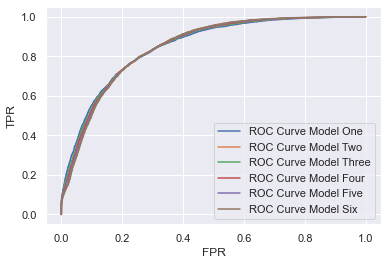

In [70]:
# ROC Curve for Logistic Regression with different class weight
plt.plot(fpr_one, tpr_one,label="ROC Curve Model One")
plt.plot(fpr_two, tpr_two, label="ROC Curve Model Two")
plt.plot(fpr_three, tpr_three, label="ROC Curve Model Three")
plt.plot(fpr_four, tpr_four, label="ROC Curve Model Four")
plt.plot(fpr_five, tpr_five, label="ROC Curve Model Five")
plt.plot(fpr_six, tpr_six, label="ROC Curve Model Six")
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend()
plt.show()

In [83]:
# Modeling and Predicting

model = LogisticRegression(class_weight={1:4}).fit(X_train, y_train)

#cut_off = 0.5

# X_pred_prob = model.predict_proba(X_train)[:,1] #for checking overfitting
# X_pred = [1 if i > cut_off else 0 for i in X_pred_prob] #for checking overfitting
X_pred = model.predict(X_train) #for checking overfitting

# y_pred_prob = model.predict_proba(X_val)[:,1]
# y_pred = [1 if i > cut_off else 0 for i in y_pred_prob]
y_pred = model.predict(X_val)

In [84]:
checking_pred_df = pd.DataFrame(index=X_train.index)
#checking_pred_df['Pred_Prob'] = X_pred_prob
checking_pred_df['Prediction'] = X_pred
checking_pred_df['Real_Classification'] = y_train

In [85]:
checking_pred_df

,Prediction,Real_Classification
34942,1,1
8735,1,1
38412,0,0
41015,0,0
1537,1,1
...,...,...
65586,0,0
1803,0,0
56715,0,0
67848,0,0


In [86]:
# Checking Model's Performance (Accuracy, Precision, Sensitivity/Recall, F1 Score)
accuracy_train = accuracy_score(y_train, X_pred)
accuracy_val = accuracy_score(y_val, y_pred)

f1_train = f1_score(y_train, X_pred)
f1_val = f1_score(y_val, y_pred)

prec_train = precision_score(y_train, X_pred)
prec_val = precision_score(y_val, y_pred)

recall_train = recall_score(y_train, X_pred)
recall_val = recall_score(y_val, y_pred)

data = {'Accuracy': [accuracy_train,accuracy_val],
        'Precision': [prec_train,prec_val],
        'Sensitivity/Recall': [recall_train,recall_val],
        'F1 Score': [f1_train,f1_val]
       }

performance_df = pd.DataFrame(data=data, index=['Train', 'Validation'])
performance_df.round(4)

,Accuracy,Precision,Sensitivity/Recall,F1 Score
Train,0.7036,0.5072,0.9077,0.6508
Validation,0.7026,0.5063,0.8993,0.6479


In [87]:
# Confusion Matrix
cm = confusion_matrix(y_val, y_pred,normalize=None)
data = {'Pred. Negative': [cm[0,0], cm[1,0]], 'Pred. Positive': [cm[0,1], cm[1,1]]}
conf_matrix_df = pd.DataFrame(data=data, index=['Class. Negative', 'Class. Positive'])
conf_matrix_df.round(4)

,Pred. Negative,Pred. Positive
Class. Negative,6662,4143
Class. Positive,476,4249


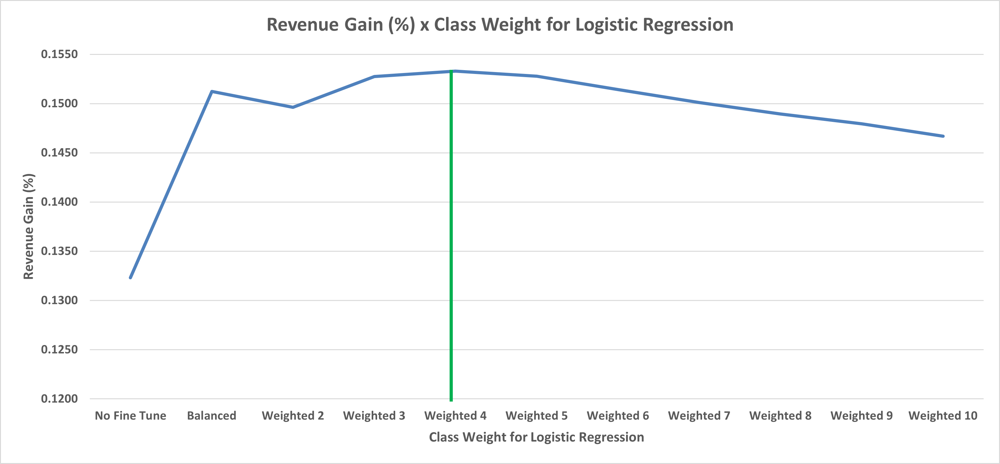

In [88]:
# The LogisticRegression was performed with different class weight in order to...
#...achieve a Sensitivity close to 0.9 (as our previous study demonstred to be the best option)
# The best parameter was Class Weight = 4
# The Previous Outputs were stored in Excel and the following graph represents the different parametes and the Revenue Gain (%)

pairplot_image_final = Image.open('Revenue_Gain_class_weight.png')
pairplot_image_final

__`The end`__